In [1]:
#Importing packages
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns


In [2]:
#Merging files [Merge the monthly data into a master dataset and categorize on types of variables (categorical and numerical)]

df1=pd.read_csv("2015.csv")
df2=pd.read_csv("2016.csv")
df3=pd.read_csv("2017.csv")
df4=pd.read_csv("2018.csv")
df5=pd.read_csv("2019.csv")
df6=pd.read_csv("2020.csv")
df7=pd.read_csv("2021.csv")
df8=pd.read_csv("2022.csv")
df9=pd.read_csv("2023.csv")

merge_df = [df1, df2, df3, df4, df5, df6, df7, df8, df9]  # List of your dataframes
df = pd.concat(merge_df)
df.sort_values('Year') #sorting by year to keep it consistent
df

,Site,Parameter,Date (LT),Year,Month,Day,Hour,NowCast Conc.,AQI,AQI Category,Raw Conc.,Conc. Unit,Duration,QC Name
0,New Delhi,PM2.5 - Principal,2015-01-01 01:00 AM,2015,1,1,1,-999.0,-999,NaN,-999.0,UG/M3,1 Hr,Missing
1,New Delhi,PM2.5 - Principal,2015-01-01 02:00 AM,2015,1,1,2,-999.0,-999,NaN,-999.0,UG/M3,1 Hr,Missing
2,New Delhi,PM2.5 - Principal,2015-01-01 03:00 AM,2015,1,1,3,-999.0,-999,NaN,-999.0,UG/M3,1 Hr,Missing
3,New Delhi,PM2.5 - Principal,2015-01-01 04:00 AM,2015,1,1,4,-999.0,-999,NaN,-999.0,UG/M3,1 Hr,Missing
4,New Delhi,PM2.5 - Principal,2015-01-01 05:00 AM,2015,1,1,5,-999.0,-999,NaN,-999.0,UG/M3,1 Hr,Missing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3619,New Delhi,PM2.5 - Principal,2023-05-31 09:00 PM,2023,5,31,21,18.5,64,Moderate,24.0,UG/M3,1 Hr,Valid
3620,New Delhi,PM2.5 - Principal,2023-05-31 10:00 PM,2023,5,31,22,25.2,79,Moderate,32.0,UG/M3,1 Hr,Valid
3621,New Delhi,PM2.5 - Principal,2023-05-31 11:00 PM,2023,5,31,23,32.1,93,Moderate,39.0,UG/M3,1 Hr,Valid
3622,New Delhi,PM2.5 - Principal,2023-06-01 12:00 AM,2023,6,1,0,38.0,107,Unhealthy for Sensitive Groups,44.0,UG/M3,1 Hr,Valid


In [3]:
#Replacing the spaces in column header names with '_' 
df.columns = df.columns.str.replace('(', '')
df.columns = df.columns.str.replace(')', '')
df.columns = df.columns.str.replace('.', '')
df.columns = df.columns.str.replace(' ', '_')
df.head(0) #getting the first row to view updated columns

,Site,Parameter,Date_LT,Year,Month,Day,Hour,NowCast_Conc,AQI,AQI_Category,Raw_Conc,Conc_Unit,Duration,QC_Name


In [4]:
df.to_csv('updated_merged_file.csv') #saving the file

In [5]:
df.info()  #Getting Data Dtype

<class 'pandas.core.frame.DataFrame'>
Index: 72047 entries, 0 to 3623
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Site          72047 non-null  object 
 1   Parameter     72047 non-null  object 
 2   Date_LT       72047 non-null  object 
 3   Year          72047 non-null  int64  
 4   Month         72047 non-null  int64  
 5   Day           72047 non-null  int64  
 6   Hour          72047 non-null  int64  
 7   NowCast_Conc  72047 non-null  float64
 8   AQI           72047 non-null  int64  
 9   AQI_Category  69158 non-null  object 
 10  Raw_Conc      72047 non-null  float64
 11  Conc_Unit     72047 non-null  object 
 12  Duration      72047 non-null  object 
 13  QC_Name       72047 non-null  object 
dtypes: float64(2), int64(5), object(7)
memory usage: 8.2+ MB


In [6]:
#Convert Date_LT Dtype from object to datetime64 

df['Date_LT'] = pd.to_datetime(df['Date_LT'], errors='ignore', format='mixed')  #If ‘ignore’, then invalid parsing will return the input.
                                                                #errors{‘ignore’, ‘raise’, ‘coerce’}, default ‘raise’

In [7]:
df.info()  #Getting Data Dtype

<class 'pandas.core.frame.DataFrame'>
Index: 72047 entries, 0 to 3623
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Site          72047 non-null  object        
 1   Parameter     72047 non-null  object        
 2   Date_LT       72047 non-null  datetime64[ns]
 3   Year          72047 non-null  int64         
 4   Month         72047 non-null  int64         
 5   Day           72047 non-null  int64         
 6   Hour          72047 non-null  int64         
 7   NowCast_Conc  72047 non-null  float64       
 8   AQI           72047 non-null  int64         
 9   AQI_Category  69158 non-null  object        
 10  Raw_Conc      72047 non-null  float64       
 11  Conc_Unit     72047 non-null  object        
 12  Duration      72047 non-null  object        
 13  QC_Name       72047 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(5), object(6)
memory usage: 8.2+ MB


In [8]:
df.shape

(72047, 14)

In [9]:
dfNew=df
dfNew

,Site,Parameter,Date_LT,Year,Month,Day,Hour,NowCast_Conc,AQI,AQI_Category,Raw_Conc,Conc_Unit,Duration,QC_Name
0,New Delhi,PM2.5 - Principal,2015-01-01 01:00:00,2015,1,1,1,-999.0,-999,NaN,-999.0,UG/M3,1 Hr,Missing
1,New Delhi,PM2.5 - Principal,2015-01-01 02:00:00,2015,1,1,2,-999.0,-999,NaN,-999.0,UG/M3,1 Hr,Missing
2,New Delhi,PM2.5 - Principal,2015-01-01 03:00:00,2015,1,1,3,-999.0,-999,NaN,-999.0,UG/M3,1 Hr,Missing
3,New Delhi,PM2.5 - Principal,2015-01-01 04:00:00,2015,1,1,4,-999.0,-999,NaN,-999.0,UG/M3,1 Hr,Missing
4,New Delhi,PM2.5 - Principal,2015-01-01 05:00:00,2015,1,1,5,-999.0,-999,NaN,-999.0,UG/M3,1 Hr,Missing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3619,New Delhi,PM2.5 - Principal,2023-05-31 21:00:00,2023,5,31,21,18.5,64,Moderate,24.0,UG/M3,1 Hr,Valid
3620,New Delhi,PM2.5 - Principal,2023-05-31 22:00:00,2023,5,31,22,25.2,79,Moderate,32.0,UG/M3,1 Hr,Valid
3621,New Delhi,PM2.5 - Principal,2023-05-31 23:00:00,2023,5,31,23,32.1,93,Moderate,39.0,UG/M3,1 Hr,Valid
3622,New Delhi,PM2.5 - Principal,2023-06-01 00:00:00,2023,6,1,0,38.0,107,Unhealthy for Sensitive Groups,44.0,UG/M3,1 Hr,Valid


In [10]:
dfNew.shape

(72047, 14)

In [11]:
# delete all rows with column 'QC_Name' has value missing, invalid or suspect
index_qc_name = dfNew[ (dfNew['QC_Name'] == 'Missing') | (dfNew['QC_Name'] == 'Invalid') | (dfNew['QC_Name'] == 'Suspect') ].index
dfNew.drop(index_qc_name , inplace=True)
print(f'New shape with dfNew is {dfNew.shape}')


New shape with dfNew is (49078, 14)


In [12]:
dfNew.to_csv('cleaned_merged_file.csv') #saving the file

In [13]:
dfNew_1=dfNew
dfNew_1.shape

(49078, 14)

In [14]:
dfNew_2=dfNew_1
dfNew_2.shape

(49078, 14)

In [15]:
dfNew_3 = dfNew_2.reset_index()
dfNew_3

,index,Site,Parameter,Date_LT,Year,Month,Day,Hour,NowCast_Conc,AQI,AQI_Category,Raw_Conc,Conc_Unit,Duration,QC_Name
0,1300,New Delhi,PM2.5 - Principal,2015-02-24 05:00:00,2015,2,24,5,-999.0,-999,NaN,186.0,UG/M3,1 Hr,Valid
1,1301,New Delhi,PM2.5 - Principal,2015-02-24 06:00:00,2015,2,24,6,182.4,233,Very Unhealthy,179.0,UG/M3,1 Hr,Valid
2,1302,New Delhi,PM2.5 - Principal,2015-02-24 07:00:00,2015,2,24,7,186.9,237,Very Unhealthy,195.0,UG/M3,1 Hr,Valid
3,1303,New Delhi,PM2.5 - Principal,2015-02-24 08:00:00,2015,2,24,8,193.2,243,Very Unhealthy,207.0,UG/M3,1 Hr,Valid
4,1304,New Delhi,PM2.5 - Principal,2015-02-24 09:00:00,2015,2,24,9,227.3,277,Very Unhealthy,275.0,UG/M3,1 Hr,Valid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49073,3618,New Delhi,PM2.5 - Principal,2023-05-31 20:00:00,2023,5,31,20,13.0,53,Moderate,14.0,UG/M3,1 Hr,Valid
49074,3619,New Delhi,PM2.5 - Principal,2023-05-31 21:00:00,2023,5,31,21,18.5,64,Moderate,24.0,UG/M3,1 Hr,Valid
49075,3620,New Delhi,PM2.5 - Principal,2023-05-31 22:00:00,2023,5,31,22,25.2,79,Moderate,32.0,UG/M3,1 Hr,Valid
49076,3621,New Delhi,PM2.5 - Principal,2023-05-31 23:00:00,2023,5,31,23,32.1,93,Moderate,39.0,UG/M3,1 Hr,Valid


In [16]:
index_hour_req = dfNew_3[ ~((dfNew_3['Hour'] == 0) | (dfNew_3['Hour'] == 6)| (dfNew_3['Hour'] == 12)| 
                         (dfNew_3['Hour'] == 18))].index 
index_hour_req

Index([    0,     2,     3,     4,     5,     6,     8,     9,    10,    11,
       ...
       49066, 49067, 49068, 49069, 49070, 49072, 49073, 49074, 49075, 49076],
      dtype='int64', length=40915)

In [17]:
dfNew_3.drop(index_hour_req , inplace=True)


In [18]:
dfNew_3.shape

(8163, 15)

In [19]:
dfNew_3.to_csv('master_dataset.csv') #saving the clean file with another name

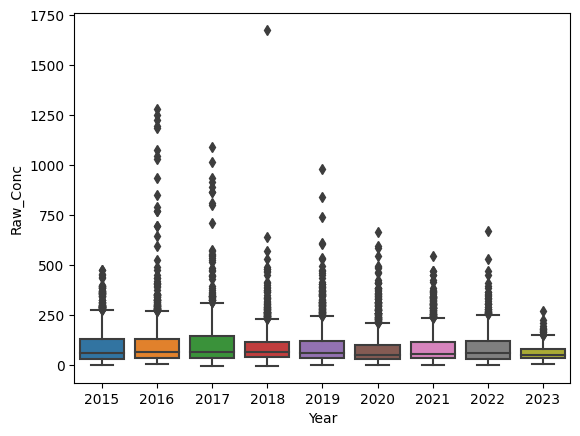

In [20]:
sns.boxplot(x=dfNew_3.Year, y=dfNew_3.Raw_Conc, data=pd.melt(dfNew_3))

plt.show()

In [21]:
Final_file=dfNew_3

In [22]:
#Dropping all -999 rows as they will hinder with the data
#dfNew=df.replace(-999,np.nan)
Final_file.isna().sum()

index            0
Site             0
Parameter        0
Date_LT          0
Year             0
Month            0
Day              0
Hour             0
NowCast_Conc     0
AQI              0
AQI_Category    19
Raw_Conc         0
Conc_Unit        0
Duration         0
QC_Name          0
dtype: int64

In [23]:
Final_file.dropna()
Final_file.shape

(8163, 15)

In [24]:
Final_file.isna().sum()

index            0
Site             0
Parameter        0
Date_LT          0
Year             0
Month            0
Day              0
Hour             0
NowCast_Conc     0
AQI              0
AQI_Category    19
Raw_Conc         0
Conc_Unit        0
Duration         0
QC_Name          0
dtype: int64

In [25]:
Final_file = Final_file.reset_index()


In [26]:
index_aqi_ctg_na = Final_file[ (Final_file['AQI'] == -999) ].index
index_aqi_ctg_na
Final_file.drop(index_aqi_ctg_na , inplace=True)
print(f'New shape with dfNew is {Final_file.shape}')

New shape with dfNew is (8144, 16)


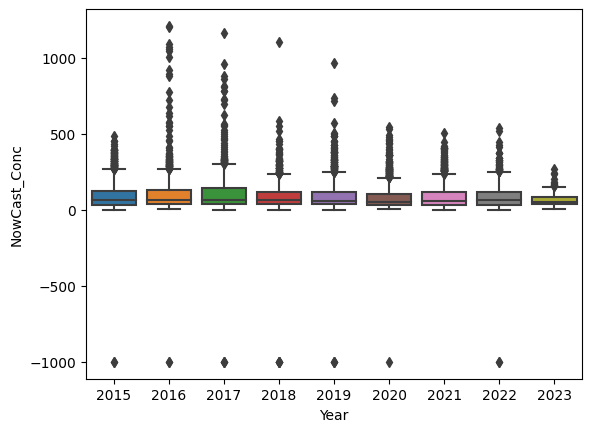

In [27]:
sns.boxplot(x=dfNew_3.Year, y=dfNew_3.NowCast_Conc, data=pd.melt(dfNew_3))

plt.show()

In [28]:
Final_file.to_csv('clean_dataset.csv') #saving the file

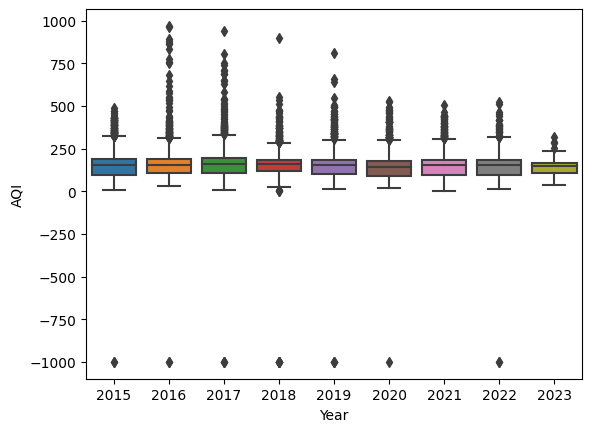

In [29]:
sns.boxplot(x=dfNew_3.Year, y=dfNew_3.AQI, data=pd.melt(dfNew_3))

plt.show()

In [30]:
#Checking any values less than 0 and dropping it as we cannot have less than 0 values.

index_less_zero_raw = Final_file[ (Final_file['Raw_Conc'] < 0) ].index
index_less_zero_now = Final_file[ (Final_file['NowCast_Conc'] < 0) ].index
index_less_zero_aqi = Final_file[ (Final_file['AQI'] < 0) ].index

print(f'index_less_zero_raw: {index_less_zero_raw}, index_less_zero_now: {index_less_zero_now} & index_less_zero_aqi: {index_less_zero_aqi}')




index_less_zero_raw: Index([2651, 3617, 6189], dtype='int64'), index_less_zero_now: Index([], dtype='int64') & index_less_zero_aqi: Index([], dtype='int64')


## From above it is clear that only raw_conc has 3 values less than 0 and we need to drop it to make the data clearer for further evalution

## From the above boxplot we could see some differences so I will remove the value and replot to see any differences

In [31]:
Final_file.drop(index_less_zero_raw , inplace=True)
print(f'New shape after removal is {Final_file.shape}')

New shape after removal is (8141, 16)


In [32]:
Final_file.describe()

,level_0,index,Date_LT,Year,Month,Day,Hour,NowCast_Conc,AQI,Raw_Conc
count,8141.000000,8141.000000,8141,8141.000000,8141.000000,8141.000000,8141.000000,8141.000000,8141.000000,8141.000000
mean,24631.362118,4854.286206,2019-03-19 04:56:21.992384256,2018.639971,7.385088,15.754330,8.963518,96.872534,162.487532,95.832085
min,1.000000,1300.000000,2015-02-24 06:00:00,2015.000000,1.000000,1.000000,0.000000,0.700000,3.000000,0.000000
25%,12348.000000,2897.000000,2017-03-04 18:00:00,2017.000000,5.000000,8.000000,0.000000,36.000000,102.000000,34.000000
50%,24739.000000,4632.000000,2019-04-23 06:00:00,2019.000000,7.000000,16.000000,6.000000,62.300000,155.000000,60.000000
75%,36895.000000,6864.000000,2021-04-29 06:00:00,2021.000000,10.000000,23.000000,18.000000,121.500000,185.000000,120.000000
max,49077.000000,8783.000000,2023-06-01 00:00:00,2023.000000,12.000000,31.000000,18.000000,1210.800000,969.000000,1676.000000
std,14176.528775,2209.103207,NaN,2.418239,3.045473,8.758181,6.725964,99.147926,88.568384,102.532819


## From above it seems that min and max values are way too spaced out and needs filtering but first we will plot before removing anymore data

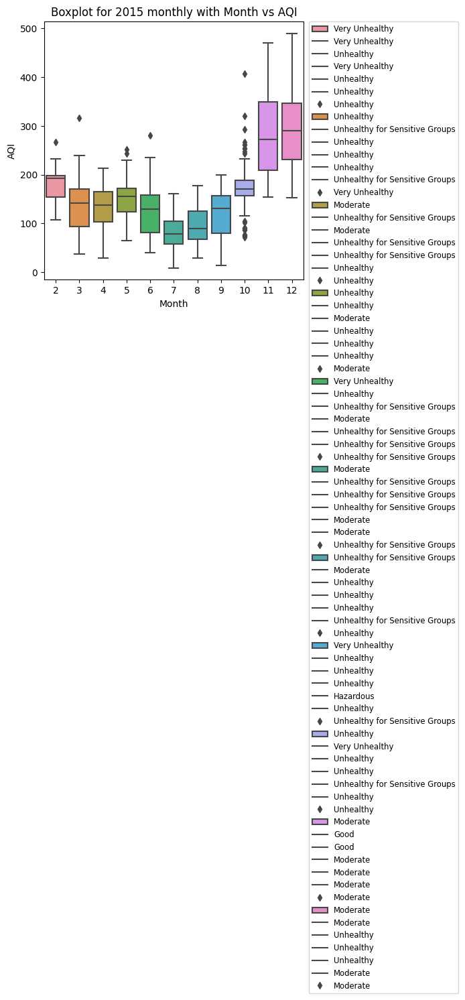

In [33]:
#Boxplot for 2015 monthly

yearly_data_month_1 = Final_file[Final_file.Year == 2015] 

plt.figure(figsize=(5, 5))
sns.boxplot(x='Month', y='value', data=pd.melt(yearly_data_month_1, id_vars=['Month'], value_vars=['AQI']))
plt.xlabel('Month')
plt.ylabel('AQI')
plt.title('Boxplot for 2015 monthly with Month vs AQI')
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')


plt.show()


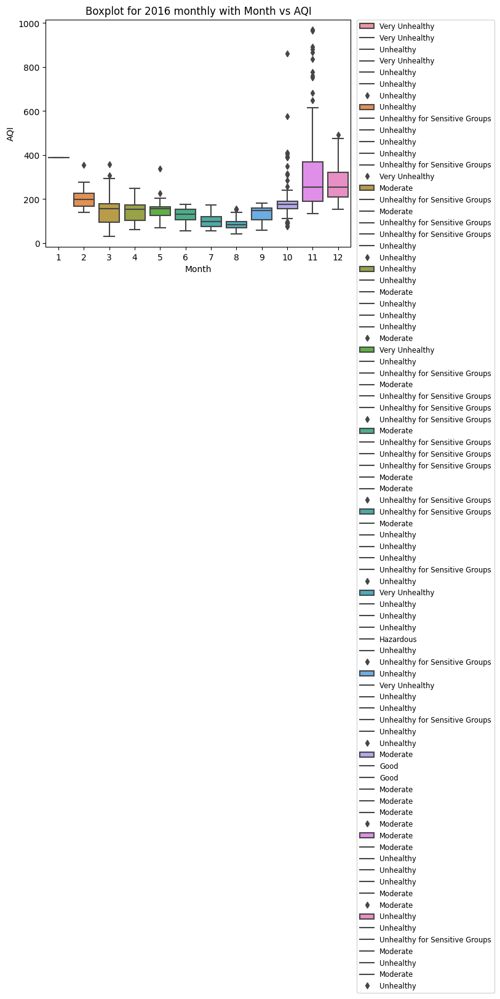

In [34]:
#Boxplot for 2016 monthly

yearly_data_month_2 = Final_file[Final_file.Year == 2016] 

#plt.figure(figsize=(5, 5))
sns.boxplot(x='Month', y='value', data=pd.melt(yearly_data_month_2, id_vars=['Month'], value_vars=['AQI']))
plt.xlabel('Month')
plt.ylabel('AQI')
plt.title('Boxplot for 2016 monthly with Month vs AQI')
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')


plt.show()


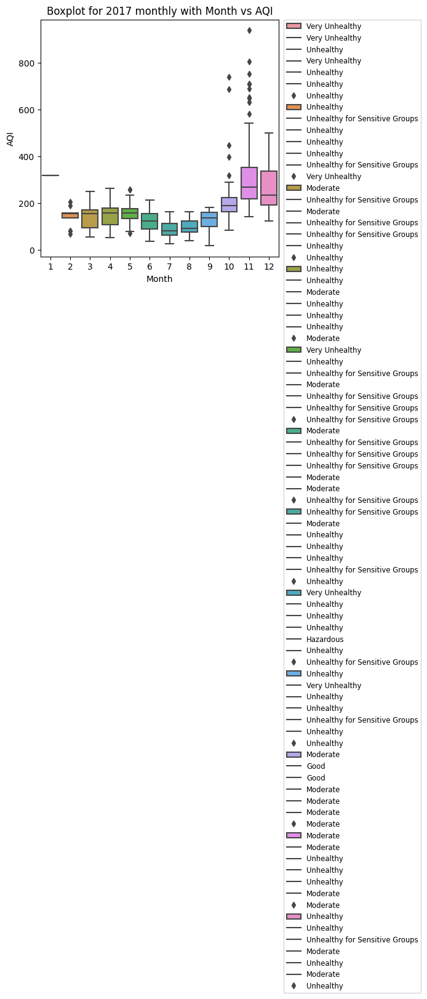

In [35]:
#Boxplot for 2017 monthly

yearly_data_month_3 = Final_file[Final_file.Year == 2017] 

plt.figure(figsize=(5, 5))
sns.boxplot(x='Month', y='value', data=pd.melt(yearly_data_month_3, id_vars=['Month'], value_vars=['AQI']))

plt.xlabel('Month')
plt.ylabel('AQI')
plt.title('Boxplot for 2017 monthly with Month vs AQI')
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')


plt.show()


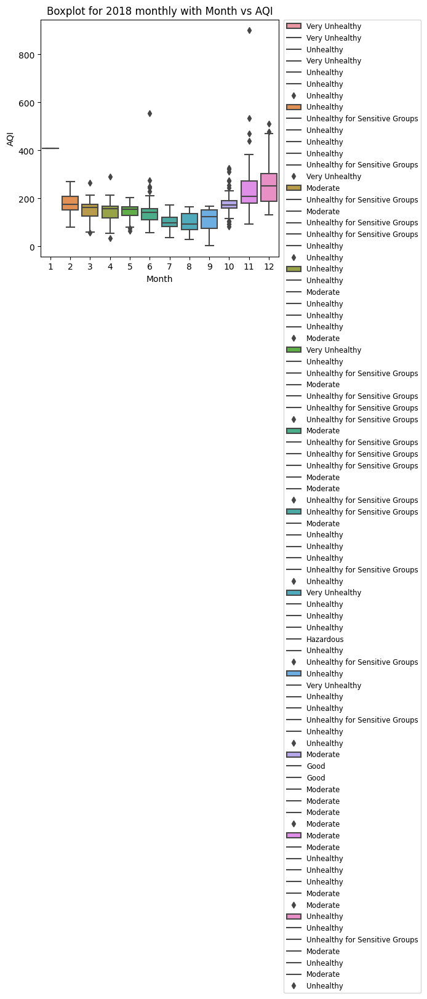

In [36]:
#Boxplot for 2018 monthly

yearly_data_month_4 = Final_file[Final_file.Year == 2018] 

plt.figure(figsize=(5, 5))
sns.boxplot(x='Month', y='value', data=pd.melt(yearly_data_month_4, id_vars=['Month'], value_vars=['AQI']))

plt.xlabel('Month')
plt.ylabel('AQI')
plt.title('Boxplot for 2018 monthly with Month vs AQI')
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')

plt.show()


### deviations

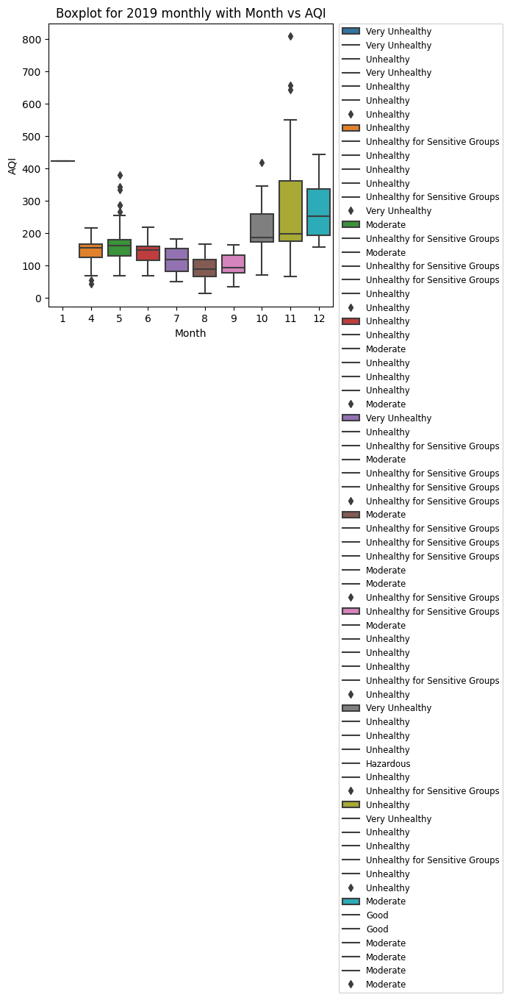

In [37]:
#Boxplot for 2019 monthly

yearly_data_month_5 = Final_file[Final_file.Year == 2019] 

plt.figure(figsize=(5, 5))
sns.boxplot(x='Month', y='value', data=pd.melt(yearly_data_month_5, id_vars=['Month'], value_vars=['AQI']))

plt.xlabel('Month')
plt.ylabel('AQI')
plt.title('Boxplot for 2019 monthly with Month vs AQI')
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')

plt.show()


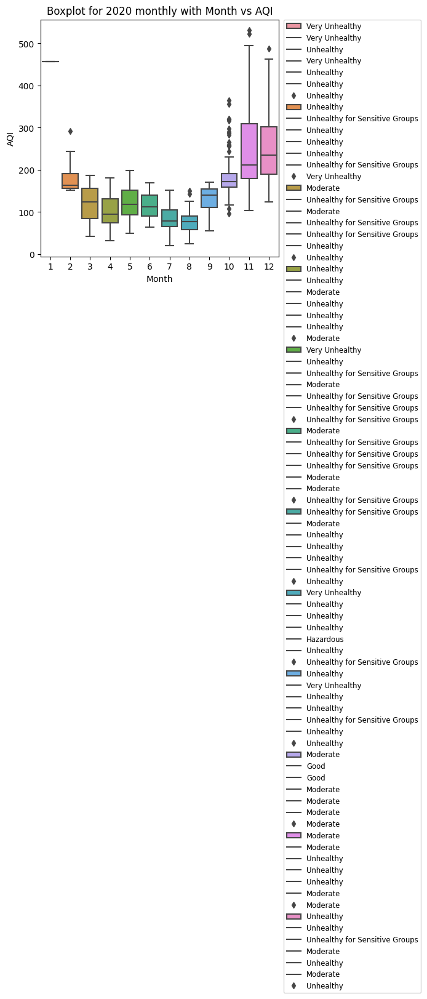

In [38]:
#Boxplot for 2020 monthly

yearly_data_month_6 = Final_file[Final_file.Year == 2020] 

plt.figure(figsize=(5, 5))
sns.boxplot(x='Month', y='value', data=pd.melt(yearly_data_month_6, id_vars=['Month'], value_vars=['AQI']))

plt.xlabel('Month')
plt.ylabel('AQI')
plt.title('Boxplot for 2020 monthly with Month vs AQI')
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')

plt.show()


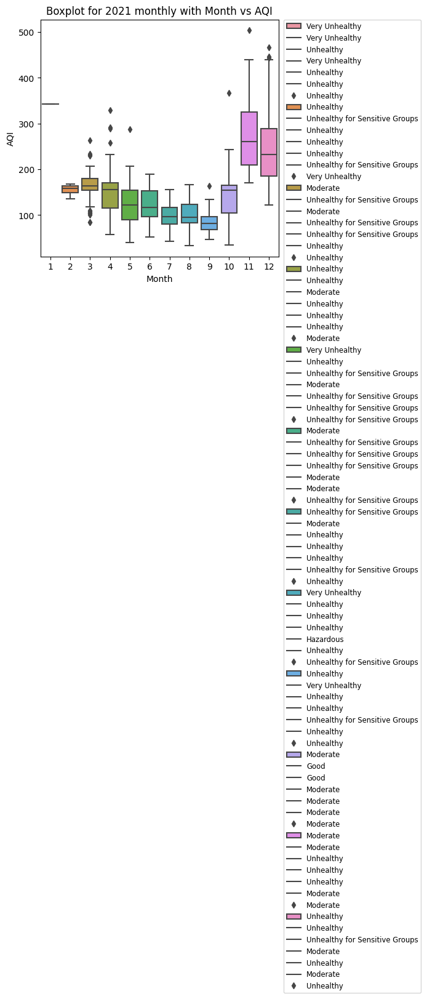

In [39]:
#Boxplot for 2021 monthly

yearly_data_month_7 = Final_file[Final_file.Year == 2021] 

plt.figure(figsize=(5, 5))
sns.boxplot(x='Month', y='value', data=pd.melt(yearly_data_month_7, id_vars=['Month'], value_vars=['AQI']))

plt.xlabel('Month')
plt.ylabel('AQI')
plt.title('Boxplot for 2021 monthly with Month vs AQI')
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')

plt.show()


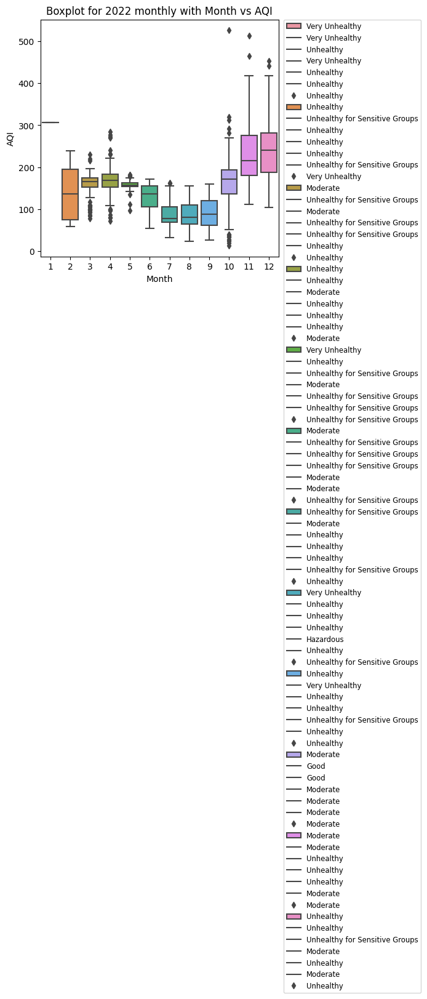

In [40]:
#Boxplot for 2022 monthly

yearly_data_month_8 = Final_file[Final_file.Year == 2022] 

plt.figure(figsize=(5, 5))
sns.boxplot(x='Month', y='value', data=pd.melt(yearly_data_month_8, id_vars=['Month'], value_vars=['AQI']))

plt.xlabel('Month')
plt.ylabel('AQI')
plt.title('Boxplot for 2022 monthly with Month vs AQI')
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')

plt.show()


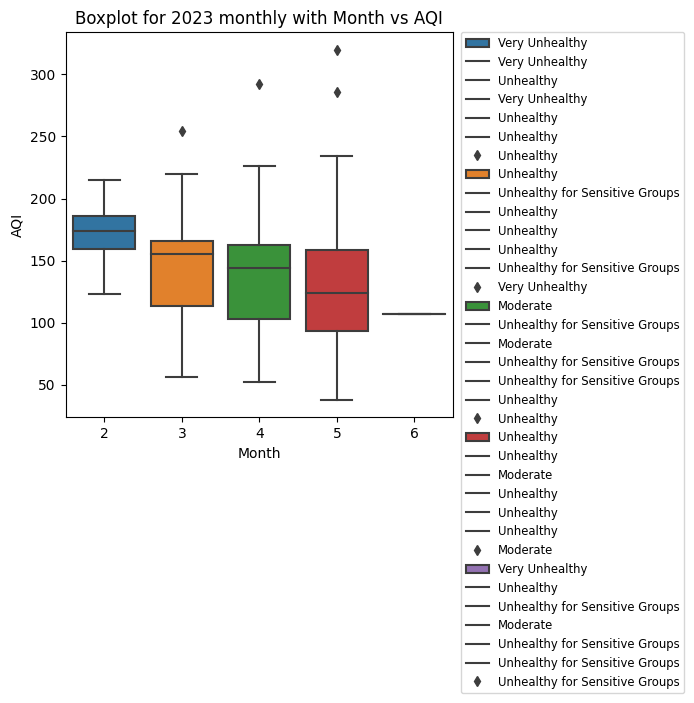

In [41]:
#Boxplot for 2023 monthly

yearly_data_month_9 = Final_file[Final_file.Year == 2023] 

plt.figure(figsize=(5, 5))
sns.boxplot(x='Month', y='value', data=pd.melt(yearly_data_month_9, id_vars=['Month'], value_vars=['AQI']))
plt.xlabel('Month')
plt.ylabel('AQI')
plt.title('Boxplot for 2023 monthly with Month vs AQI')
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')


plt.show()


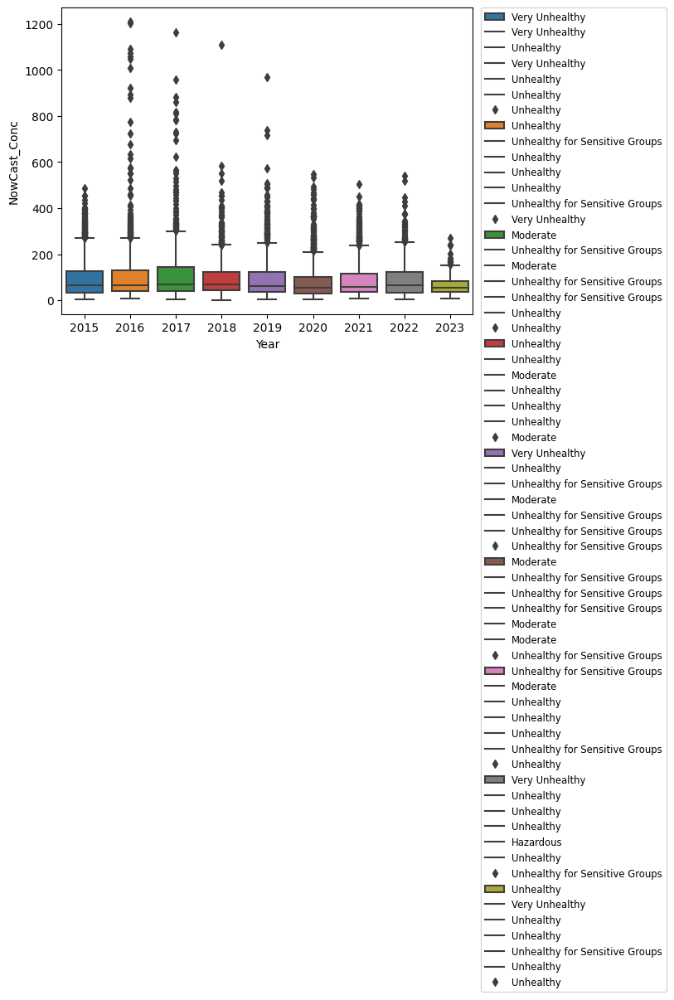

In [42]:
#Nowcast plotting with year on overall data

sns.boxplot(x=Final_file.Year, y=Final_file.NowCast_Conc, data=pd.melt(Final_file))
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')

plt.show()

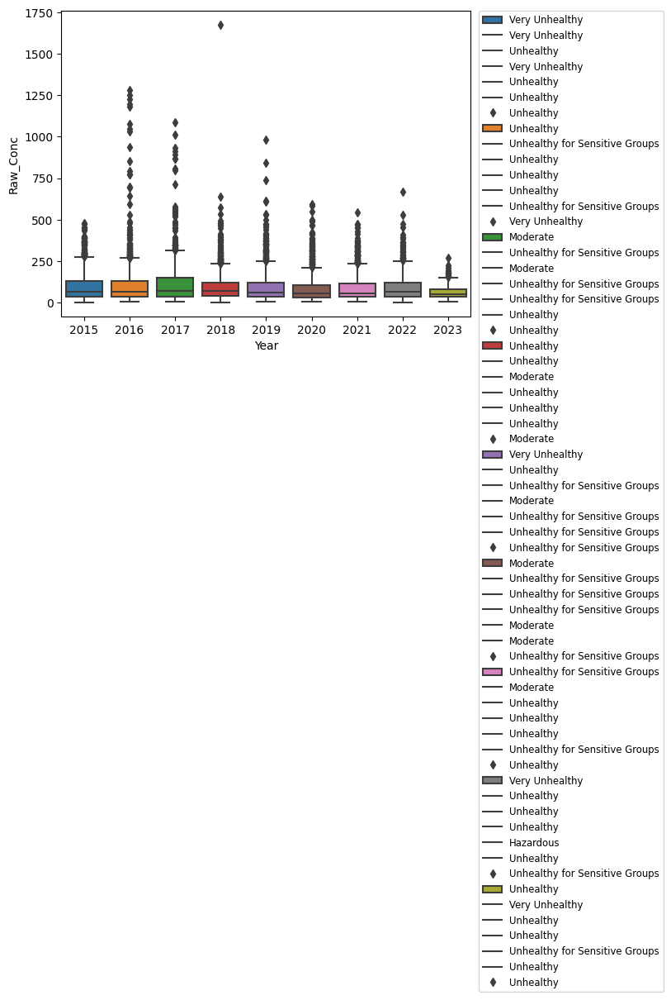

In [43]:
#Raw concentration plotting with year on overall data

sns.boxplot(x=Final_file.Year, y=Final_file.Raw_Conc, data=pd.melt(Final_file))
plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')

plt.show()

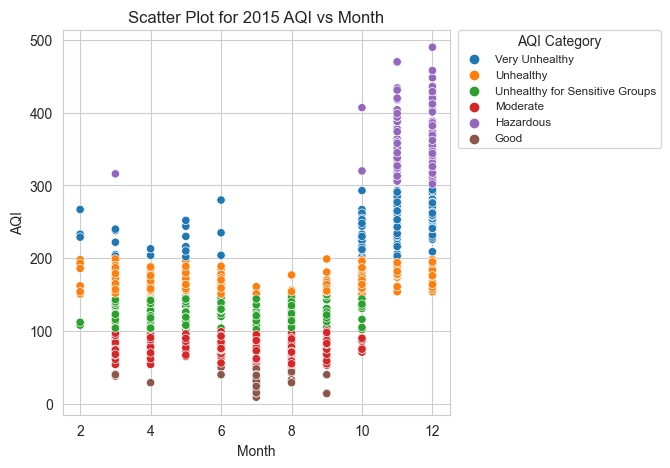

In [44]:
#Scatterplot for 2015 monthly

plt.figure(figsize=(5, 5))
sns.set_style('whitegrid') #whitegrid, darkgrid, dark, white

scatter_monthly_1 = Final_file[Final_file['Year'] == 2015]  

scatter_plot = sns.scatterplot(data=scatter_monthly_1, x='Month', y='AQI', hue='AQI_Category')
scatter_plot.set_title('Scatter Plot for 2015 AQI vs Month')
scatter_plot.legend(title='AQI Category', fontsize='small',bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None)

plt.show()


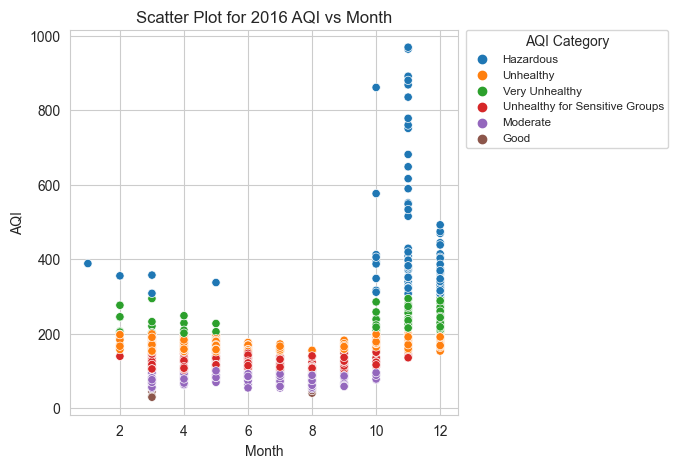

In [45]:
#Scatterplot for 2016 monthly

plt.figure(figsize=(5, 5))
sns.set_style('whitegrid') #whitegrid, darkgrid, dark, white

scatter_monthly_2 = Final_file[Final_file['Year'] == 2016]  

scatter_plot = sns.scatterplot(data=scatter_monthly_2, x='Month', y='AQI', hue='AQI_Category')
scatter_plot.set_title('Scatter Plot for 2016 AQI vs Month')
scatter_plot.legend(title='AQI Category', fontsize='small',bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None)

plt.show()


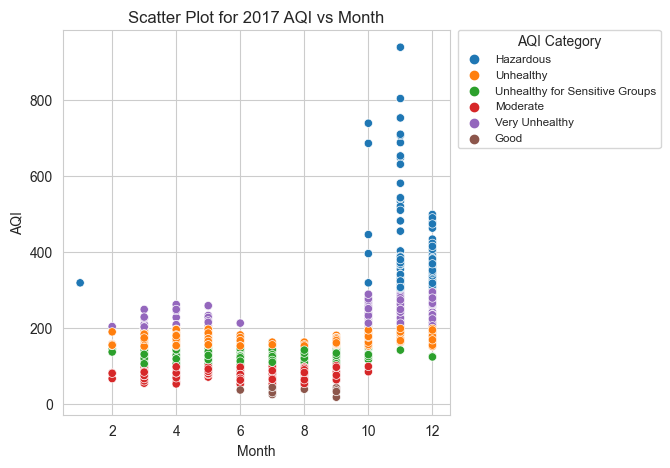

In [46]:
#Scatterplot for 2017 monthly

plt.figure(figsize=(5, 5))
sns.set_style('whitegrid') #whitegrid, darkgrid, dark, white

scatter_monthly_3 = Final_file[Final_file['Year'] == 2017]  

scatter_plot = sns.scatterplot(data=scatter_monthly_3, x='Month', y='AQI', hue='AQI_Category')
scatter_plot.set_title('Scatter Plot for 2017 AQI vs Month')
scatter_plot.legend(title='AQI Category', fontsize='small',bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None)

plt.show()


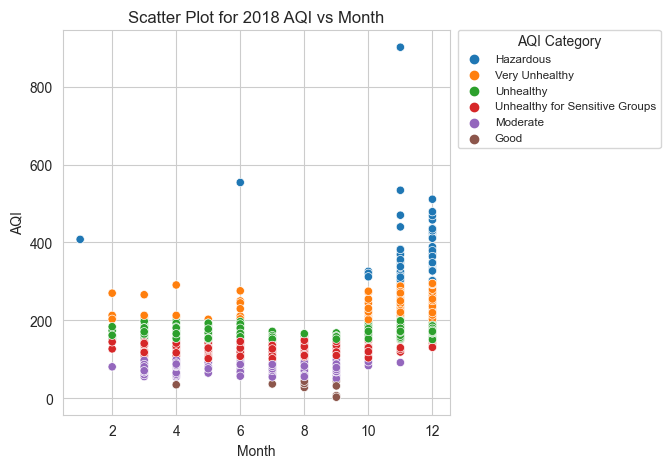

In [47]:
#Scatterplot for 2018 monthly

plt.figure(figsize=(5, 5))
sns.set_style('whitegrid') #whitegrid, darkgrid, dark, white

scatter_monthly_4 = Final_file[Final_file['Year'] == 2018]  

scatter_plot = sns.scatterplot(data=scatter_monthly_4, x='Month', y='AQI', hue='AQI_Category')
scatter_plot.set_title('Scatter Plot for 2018 AQI vs Month')
scatter_plot.legend(title='AQI Category', fontsize='small',bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None)

plt.show()


### dispersion of data, moderate distribution is 2,4

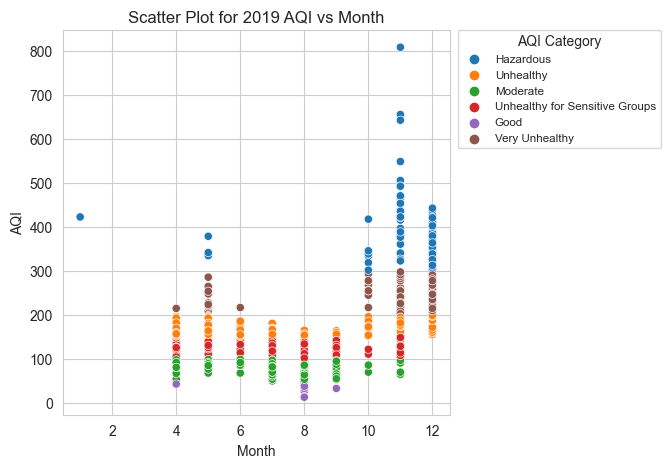

In [48]:
#Scatterplot for 2019 monthly

plt.figure(figsize=(5, 5))
sns.set_style('whitegrid') #whitegrid, darkgrid, dark, white

scatter_monthly_5 = Final_file[Final_file['Year'] == 2019]  

scatter_plot = sns.scatterplot(data=scatter_monthly_5, x='Month', y='AQI', hue='AQI_Category')
scatter_plot.set_title('Scatter Plot for 2019 AQI vs Month')
scatter_plot.legend(title='AQI Category', fontsize='small',bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None)

plt.show()


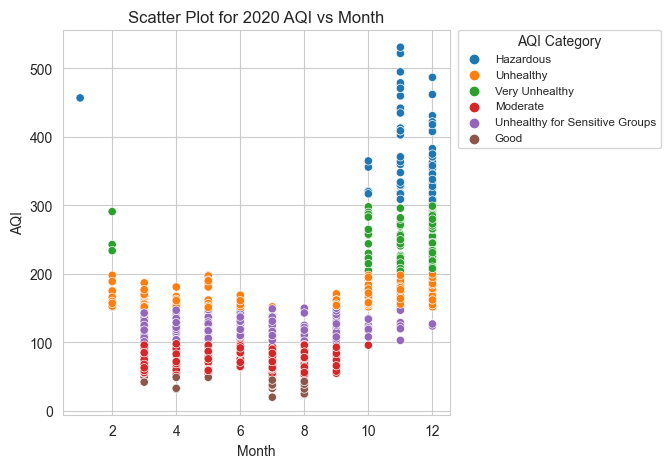

In [49]:
#Scatterplot for 2020 monthly

plt.figure(figsize=(5, 5))
sns.set_style('whitegrid') #whitegrid, darkgrid, dark, white

scatter_monthly_6 = Final_file[Final_file['Year'] == 2020]  

scatter_plot = sns.scatterplot(data=scatter_monthly_6, x='Month', y='AQI', hue='AQI_Category')
scatter_plot.set_title('Scatter Plot for 2020 AQI vs Month')
scatter_plot.legend(title='AQI Category', fontsize='small',bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None)

plt.show()


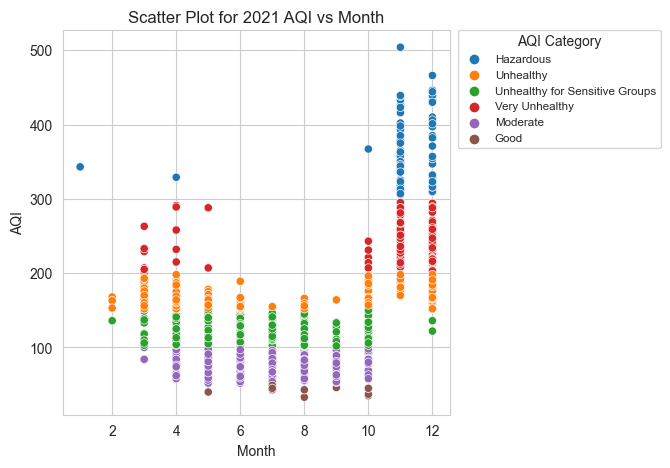

In [50]:
#Scatterplot for 2021 monthly

plt.figure(figsize=(5, 5))
sns.set_style('whitegrid') #whitegrid, darkgrid, dark, white

scatter_monthly_7 = Final_file[Final_file['Year'] == 2021]  

scatter_plot = sns.scatterplot(data=scatter_monthly_7, x='Month', y='AQI', hue='AQI_Category')
scatter_plot.set_title('Scatter Plot for 2021 AQI vs Month')
scatter_plot.legend(title='AQI Category', fontsize='small',bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None)

plt.show()


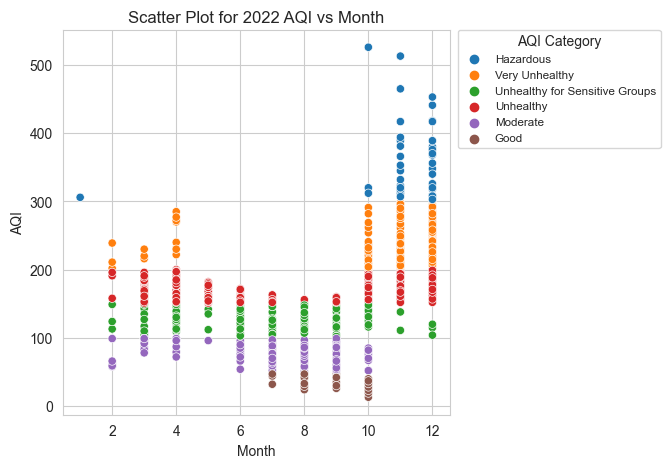

In [51]:
#Scatterplot for 2022 monthly

plt.figure(figsize=(5, 5))
sns.set_style('whitegrid') #whitegrid, darkgrid, dark, white

scatter_monthly_8 = Final_file[Final_file['Year'] == 2022]  

scatter_plot = sns.scatterplot(data=scatter_monthly_8, x='Month', y='AQI', hue='AQI_Category')
scatter_plot.set_title('Scatter Plot for 2022 AQI vs Month')
scatter_plot.legend(title='AQI Category', fontsize='small',bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None)

plt.show()


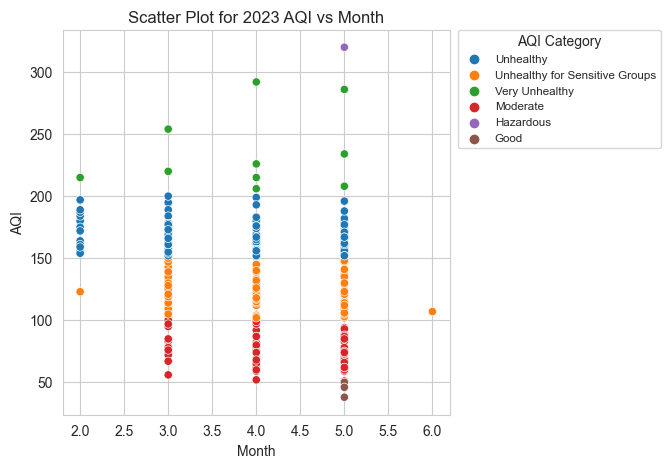

In [52]:
#Scatterplot for 2023 monthly

plt.figure(figsize=(5, 5))
sns.set_style('whitegrid') #whitegrid, darkgrid, dark, white

scatter_monthly_9 = Final_file[Final_file['Year'] == 2023]  

scatter_plot = sns.scatterplot(data=scatter_monthly_9, x='Month', y='AQI', hue='AQI_Category')
scatter_plot.set_title('Scatter Plot for 2023 AQI vs Month')
scatter_plot.legend(title='AQI Category', fontsize='small',bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None)

plt.show()


<Figure size 1000x1000 with 0 Axes>

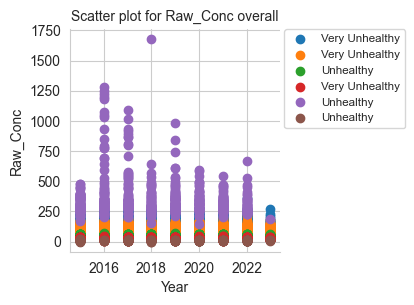

In [53]:
#Scatter plot for Raw_Conc

plt.figure(figsize=(10,10))
sns.set_style('whitegrid')  #whitegrid, darkgrid, dark, white
sns.FacetGrid(Final_file, hue='AQI_Category').map(plt.scatter,'Year','Raw_Conc')
plt.title('Scatter plot for Raw_Conc overall',fontsize='medium')

plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')

plt.show()

<Figure size 1000x1000 with 0 Axes>

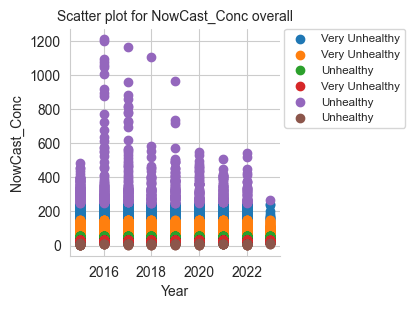

In [54]:
#Scatter plot for NowCast_Conc

plt.figure(figsize=(10,10))
sns.set_style('whitegrid')  #whitegrid, darkgrid, dark, white
sns.FacetGrid(Final_file, hue='AQI_Category').map(plt.scatter,'Year','NowCast_Conc')
plt.title('Scatter plot for NowCast_Conc overall',fontsize='medium')

plt.legend(Final_file.AQI_Category,bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None, fontsize='small')

plt.show()

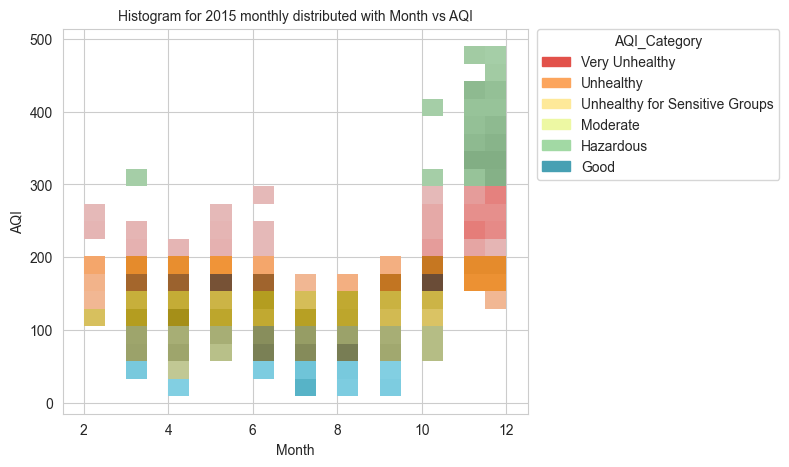

In [55]:
#Histogram for 2015 monthly distributed with Month vs AQI

fig = plt.figure(figsize=(6,5))

hist_monthly_1 = Final_file[Final_file['Year'] == 2015]  

plt.title('Histogram for 2015 monthly distributed with Month vs AQI',fontsize='medium')

ax = sns.histplot(data=hist_monthly_1,x=Final_file.Month, y=Final_file.AQI, palette = "Spectral",hue="AQI_Category", bins=20, legend='auto')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1.02, 1),borderaxespad=0)

plt.show()


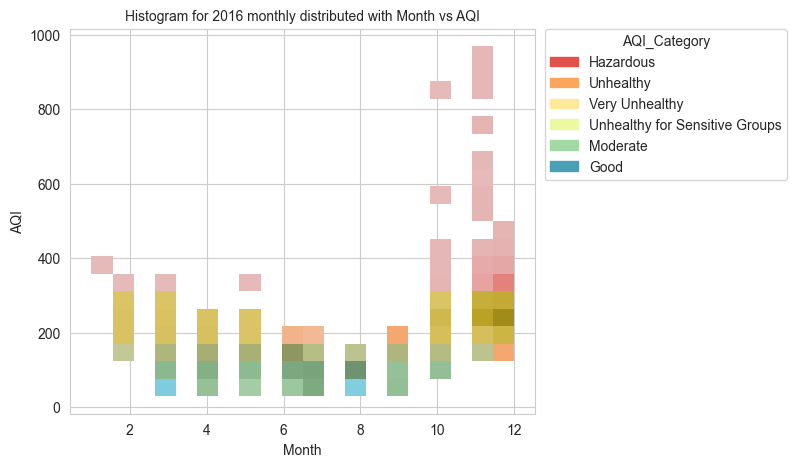

In [56]:
#Histogram for 2016 monthly distributed with Month vs AQI

fig = plt.figure(figsize=(6,5))

hist_monthly_2 = Final_file[Final_file['Year'] == 2016]  

plt.title('Histogram for 2016 monthly distributed with Month vs AQI',fontsize='medium')

ax = sns.histplot(data=hist_monthly_2,x=Final_file.Month, y=Final_file.AQI, palette = "Spectral", hue="AQI_Category",bins=20, legend='auto')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1.02, 1),borderaxespad=0)

plt.show()


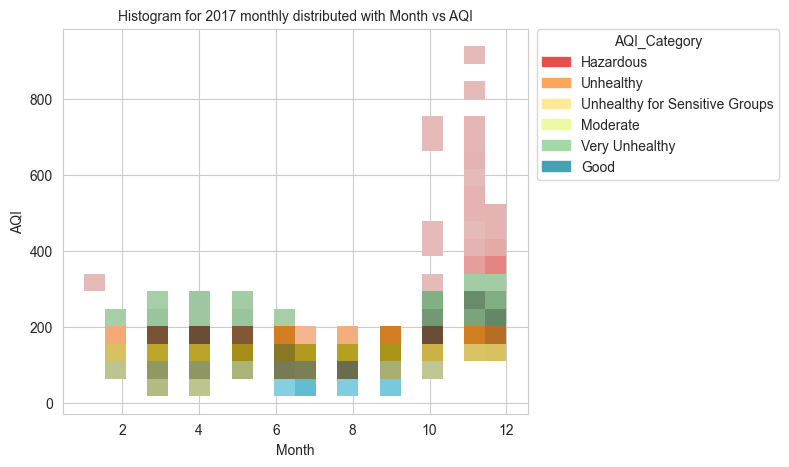

In [57]:
#Histogram for 2017 monthly distributed with Month vs AQI

fig = plt.figure(figsize=(6,5))

hist_monthly_3 = Final_file[Final_file['Year'] == 2017]  

plt.title('Histogram for 2017 monthly distributed with Month vs AQI',fontsize='medium')

ax = sns.histplot(data=hist_monthly_3,x=Final_file.Month, y=Final_file.AQI, palette = "Spectral", hue="AQI_Category",bins=20, legend='auto')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1.02, 1),borderaxespad=0)

plt.show()


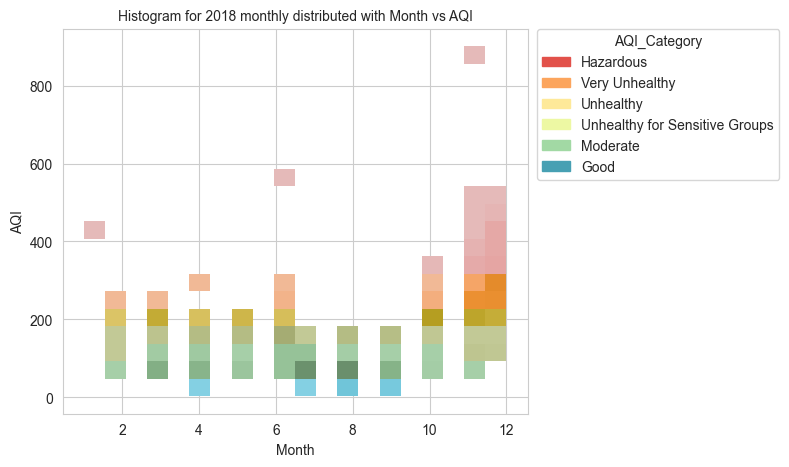

In [58]:
#Histogram for 2018 monthly distributed with Month vs AQI

fig = plt.figure(figsize=(6,5))

hist_monthly_4 = Final_file[Final_file['Year'] == 2018]  

plt.title('Histogram for 2018 monthly distributed with Month vs AQI',fontsize='medium')

ax = sns.histplot(data=hist_monthly_4,x=Final_file.Month, y=Final_file.AQI, palette = "Spectral", hue="AQI_Category",bins=20, legend='auto')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1.02, 1),borderaxespad=0)

plt.show()


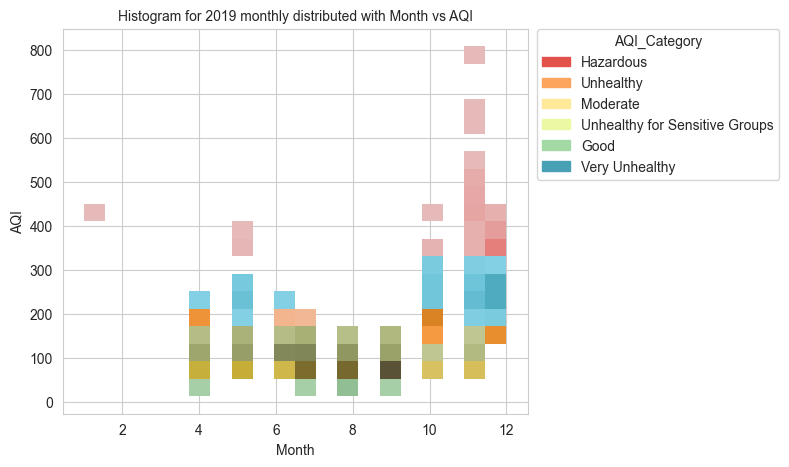

In [59]:
#Histogram for 2019 monthly distributed with Month vs AQI

fig = plt.figure(figsize=(6,5))

hist_monthly_5 = Final_file[Final_file['Year'] == 2019]  

plt.title('Histogram for 2019 monthly distributed with Month vs AQI',fontsize='medium')

ax = sns.histplot(data=hist_monthly_5,x=Final_file.Month, y=Final_file.AQI, palette = "Spectral", hue="AQI_Category",bins=20, legend='auto')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1.02, 1),borderaxespad=0)

plt.show()


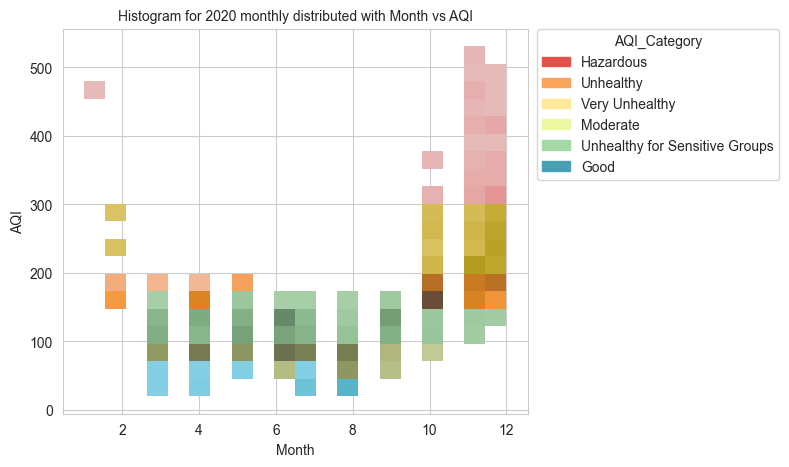

In [60]:
#Histogram for 2020 monthly distributed with Month vs AQI

fig = plt.figure(figsize=(6,5))

hist_monthly_6 = Final_file[Final_file['Year'] == 2020]  

plt.title('Histogram for 2020 monthly distributed with Month vs AQI',fontsize='medium')

ax = sns.histplot(data=hist_monthly_6,x=Final_file.Month, y=Final_file.AQI, palette = "Spectral", hue="AQI_Category",bins=20, legend='auto')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1.02, 1),borderaxespad=0)

plt.show()


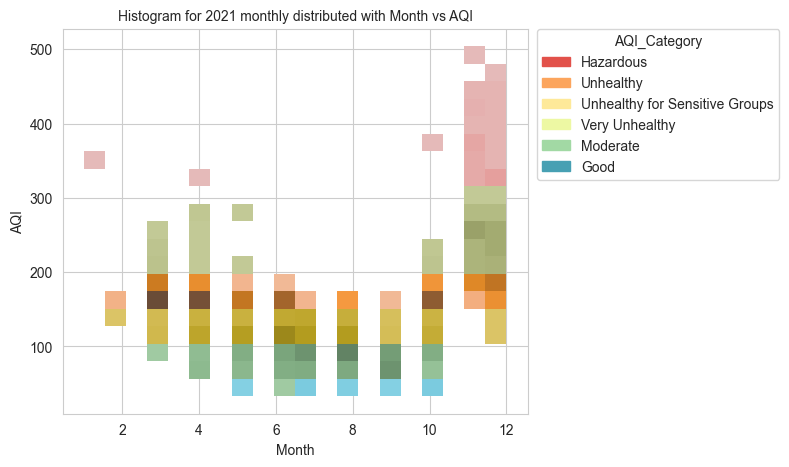

In [61]:
#Histogram for 2021 monthly distributed with Month vs AQI

fig = plt.figure(figsize=(6,5))

hist_monthly_7 = Final_file[Final_file['Year'] == 2021]  

plt.title('Histogram for 2021 monthly distributed with Month vs AQI',fontsize='medium')

ax = sns.histplot(data=hist_monthly_7,x=Final_file.Month, y=Final_file.AQI, palette = "Spectral", hue="AQI_Category",bins=20, legend='auto')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1.02, 1),borderaxespad=0)

plt.show()


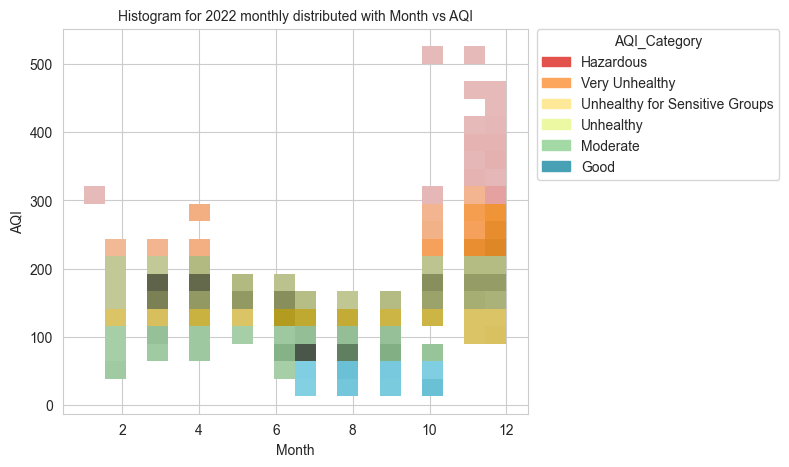

In [62]:
#Histogram for 2022 monthly distributed with Month vs AQI

fig = plt.figure(figsize=(6,5))

hist_monthly_8 = Final_file[Final_file['Year'] == 2022]  

plt.title('Histogram for 2022 monthly distributed with Month vs AQI',fontsize='medium')

ax = sns.histplot(data=hist_monthly_8,x=Final_file.Month, y=Final_file.AQI, palette = "Spectral", hue="AQI_Category",bins=20, legend='auto')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1.02, 1),borderaxespad=0)

plt.show()


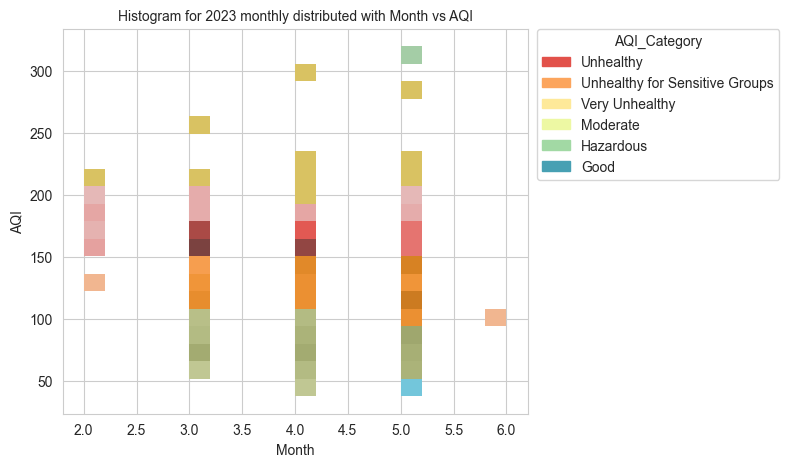

In [63]:
#Histogram for 2023 monthly distributed with Month vs AQI

fig = plt.figure(figsize=(6,5))

hist_monthly_9 = Final_file[Final_file['Year'] == 2023]  

plt.title('Histogram for 2023 monthly distributed with Month vs AQI',fontsize='medium')

ax = sns.histplot(data=hist_monthly_9,x=Final_file.Month.astype(int), y=Final_file.AQI, palette = "Spectral", hue="AQI_Category",bins=20, legend='auto')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1.02, 1),borderaxespad=0)

plt.show()


(array([6.112e+03, 1.385e+03, 4.790e+02, 1.060e+02, 2.800e+01, 8.000e+00,
        7.000e+00, 7.000e+00, 4.000e+00, 5.000e+00]),
 array([7.00000e-01, 1.21710e+02, 2.42720e+02, 3.63730e+02, 4.84740e+02,
        6.05750e+02, 7.26760e+02, 8.47770e+02, 9.68780e+02, 1.08979e+03,
        1.21080e+03]),
 <BarContainer object of 10 artists>)

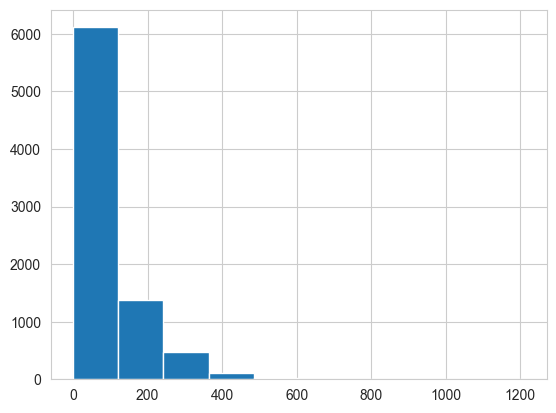

In [64]:
#Plotting histogram for NowCast_Conc

plt.hist(Final_file.NowCast_Conc)

(array([6.815e+03, 1.088e+03, 1.850e+02, 2.400e+01, 9.000e+00, 9.000e+00,
        5.000e+00, 5.000e+00, 0.000e+00, 1.000e+00]),
 array([   0. ,  167.6,  335.2,  502.8,  670.4,  838. , 1005.6, 1173.2,
        1340.8, 1508.4, 1676. ]),
 <BarContainer object of 10 artists>)

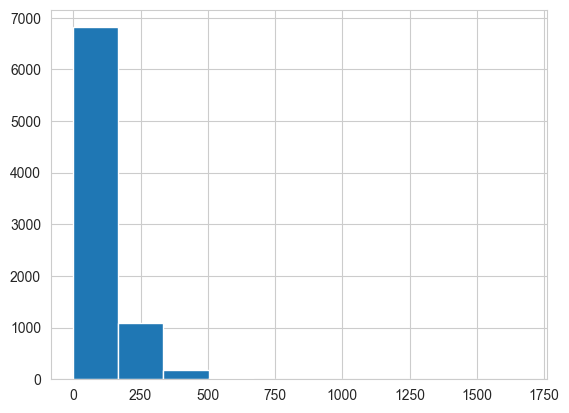

In [65]:
#Plotting histogram for Raw_Conc

plt.hist(Final_file.Raw_Conc)

## for sampling using systematic method I will dive into monthly chart and select the first 4 days with the highest peak

Text(0.5, 1.0, 'Barplot of Day vs AQI')

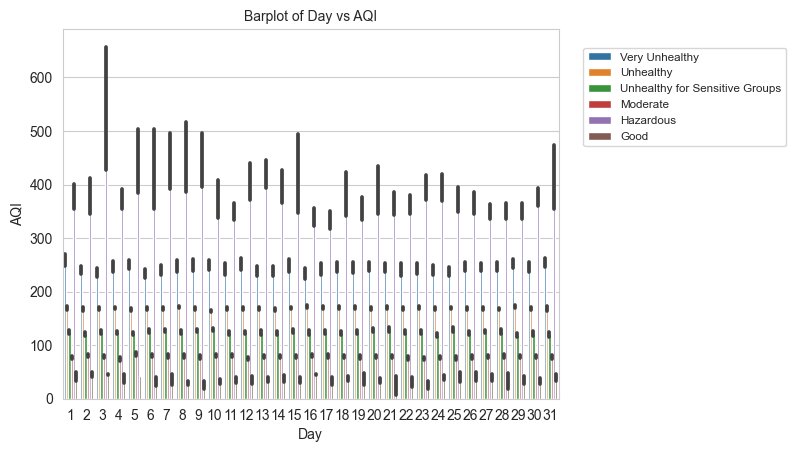

In [66]:
sns.barplot(x=Final_file['Day'],y=Final_file['AQI'],hue=Final_file['AQI_Category'])
plt.legend(bbox_to_anchor=(1.05, 0.95),fontsize='small',borderaxespad=0, fancybox=None)

plt.title('Barplot of Day vs AQI',fontsize='medium')



In [67]:
#I can see that day 3, 5, 6 & 8 has the highest AQI and hence I will choose them to learn more from systematic samplic
#and more levels

In [68]:
Final_file_2=Final_file
Final_file_2

,level_0,index,Site,Parameter,Date_LT,Year,Month,Day,Hour,NowCast_Conc,AQI,AQI_Category,Raw_Conc,Conc_Unit,Duration,QC_Name
0,1,1301,New Delhi,PM2.5 - Principal,2015-02-24 06:00:00,2015,2,24,6,182.4,233,Very Unhealthy,179.0,UG/M3,1 Hr,Valid
1,7,1307,New Delhi,PM2.5 - Principal,2015-02-24 12:00:00,2015,2,24,12,217.1,267,Very Unhealthy,190.0,UG/M3,1 Hr,Valid
2,13,1313,New Delhi,PM2.5 - Principal,2015-02-24 18:00:00,2015,2,24,18,142.0,196,Unhealthy,146.0,UG/M3,1 Hr,Valid
3,19,1319,New Delhi,PM2.5 - Principal,2015-02-25 00:00:00,2015,2,25,0,179.1,229,Very Unhealthy,181.0,UG/M3,1 Hr,Valid
4,25,1325,New Delhi,PM2.5 - Principal,2015-02-25 06:00:00,2015,2,25,6,144.3,197,Unhealthy,124.0,UG/M3,1 Hr,Valid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8158,49053,3598,New Delhi,PM2.5 - Principal,2023-05-31 00:00:00,2023,5,31,0,28.1,85,Moderate,32.0,UG/M3,1 Hr,Valid
8159,49059,3604,New Delhi,PM2.5 - Principal,2023-05-31 06:00:00,2023,5,31,6,44.5,123,Unhealthy for Sensitive Groups,27.0,UG/M3,1 Hr,Valid
8160,49065,3610,New Delhi,PM2.5 - Principal,2023-05-31 12:00:00,2023,5,31,12,17.4,62,Moderate,11.0,UG/M3,1 Hr,Valid
8161,49071,3616,New Delhi,PM2.5 - Principal,2023-05-31 18:00:00,2023,5,31,18,11.0,46,Good,6.0,UG/M3,1 Hr,Valid


In [69]:
#I can see that day 3, 5, 6 & 8 has the highest AQI and hence I will choose them to learn more from systematic samplic
#and more levels

index_hr_year = Final_file_2[ ~((Final_file_2['Day'] == 3) | (Final_file_2['Day'] == 5)| (Final_file_2['Day'] == 6)| 
                         (Final_file_2['Day'] == 8))].index 
index_hr_year

Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
       ...
       8153, 8154, 8155, 8156, 8157, 8158, 8159, 8160, 8161, 8162],
      dtype='int64', length=7084)

In [70]:
#Now I will observe which hour to choose 

Text(0.5, 1.0, 'Barplot of Hour vs AQI')

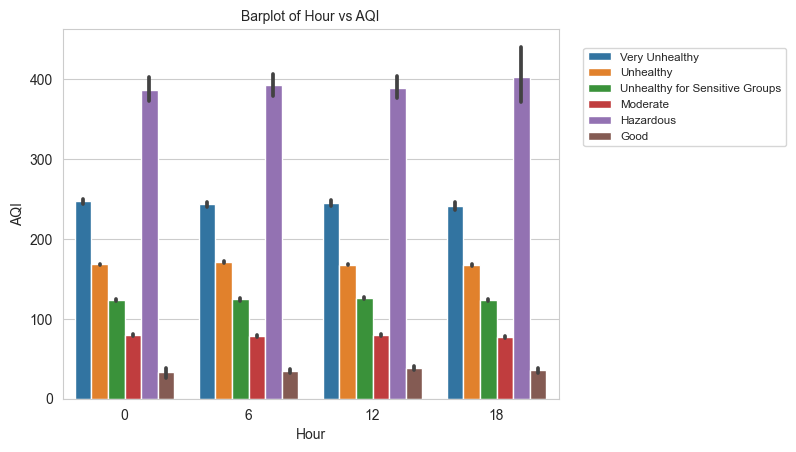

In [71]:
sns.barplot(x=Final_file['Hour'],y=Final_file['AQI'],hue=Final_file['AQI_Category'])
plt.legend(bbox_to_anchor=(1.05, 0.95),fontsize='small',borderaxespad=0, fancybox=None)
plt.title('Barplot of Hour vs AQI',fontsize='medium')


In [72]:
#From above graph it is clear that the peak is around 18pm meaning I need to check more on that. Even though it is not
#that high I will choose it for the systematic sampling process

#So the final rule for systematic sampling method is to choose day 3, 5, 6 & 8 and hour to be 18

In [73]:
#Creating new indexing for our systematic sample

index_sample_final = Final_file_2[ ~(((Final_file_2['Day'] == 3) & (Final_file_2['Hour'] == 18)) 
                                     | ((Final_file_2['Day'] == 5) &(Final_file_2['Hour'] == 18))
                                     | ((Final_file_2['Day'] == 6) &(Final_file_2['Hour'] == 18))| 
                         ((Final_file_2['Day'] == 8) &(Final_file_2['Hour'] == 18)))].index 
print(f'index_sample_final: {index_sample_final} and length is: {len(index_sample_final)}')
print(f'So our final dataset after sampling is {int(len(Final_file_2))-int(len(index_sample_final))}')

index_sample_final: Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
       ...
       8153, 8154, 8155, 8156, 8157, 8158, 8159, 8160, 8161, 8162],
      dtype='int64', length=7882) and length is: 7882
So our final dataset after sampling is 259


In [74]:
#Dropping the rest of the data set
Final_file_2.drop(index_sample_final , inplace=True)
print(f'New shape with Final_file_2 is {Final_file_2.shape}')

New shape with Final_file_2 is (259, 16)


In [75]:
#It seems the final data set after sampling and all cleaning is ready
#Exporting it to a new csv file
Final_file_2.to_csv('systematic_cleaned_file.csv') #saving the file

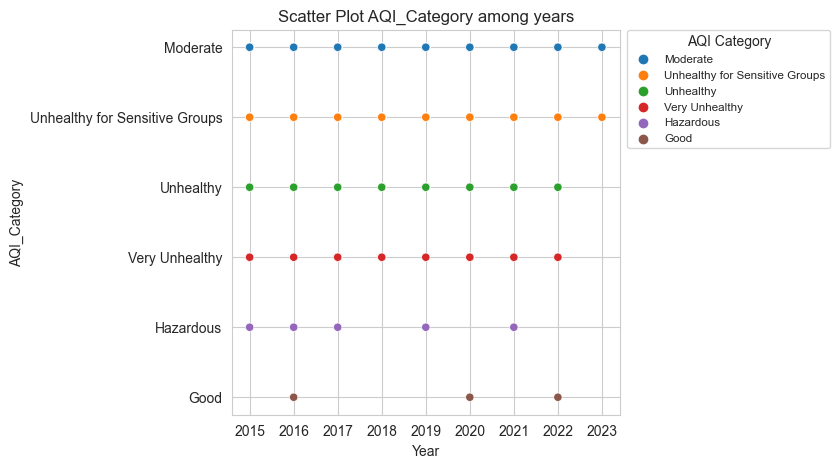

In [76]:
#Scatterplot for trend of AQI_Category
plt.figure(figsize=(5, 5))
sns.set_style('whitegrid') #whitegrid, darkgrid, dark, white


scatter_plot = sns.scatterplot(x=Final_file_2.Year, y=Final_file_2.AQI_Category, hue=Final_file_2.AQI_Category)
scatter_plot.set_title('Scatter Plot AQI_Category among years')
scatter_plot.legend(title='AQI Category', fontsize='small',bbox_to_anchor=(1.02, 1), borderaxespad=0, fancybox=None)

plt.show()


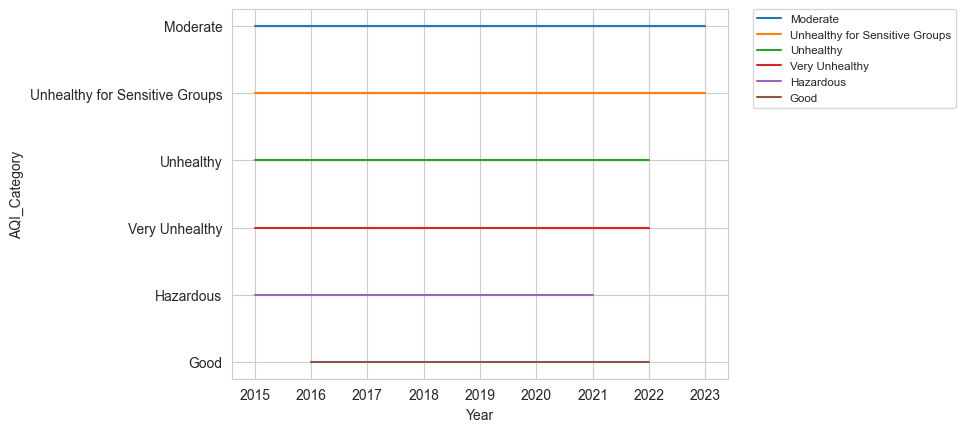

In [77]:
sns.lineplot(x=Final_file_2.Year, y=Final_file_2.AQI_Category, hue=Final_file_2.AQI_Category)
plt.legend(bbox_to_anchor=(1.05, 1),fontsize='small',borderaxespad=0, fancybox=None)


In [78]:
corr = Final_file_2.corr(numeric_only=True)
corr

,level_0,index,Year,Month,Day,Hour,NowCast_Conc,AQI,Raw_Conc
level_0,1.000000,0.009154,0.992744,0.056512,0.003576,NaN,-0.069227,-0.078916,-0.081662
index,0.009154,1.000000,-0.109891,0.990286,0.010081,NaN,0.397424,0.444039,0.380448
Year,0.992744,-0.109891,1.000000,-0.062949,0.002389,NaN,-0.115294,-0.130929,-0.125380
Month,0.056512,0.990286,-0.062949,1.000000,-0.012509,NaN,0.386439,0.433491,0.367830
Day,0.003576,0.010081,0.002389,-0.012509,1.000000,NaN,0.015939,0.013877,0.003036
Hour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NowCast_Conc,-0.069227,0.397424,-0.115294,0.386439,0.015939,NaN,1.000000,0.979257,0.989902
AQI,-0.078916,0.444039,-0.130929,0.433491,0.013877,NaN,0.979257,1.000000,0.965216
Raw_Conc,-0.081662,0.380448,-0.125380,0.367830,0.003036,NaN,0.989902,0.965216,1.000000


In [79]:
mask = np.triu(np.ones_like(corr, dtype=bool))
mask

array([[ True,  True,  True,  True,  True,  True,  True,  True,  True],
       [False,  True,  True,  True,  True,  True,  True,  True,  True],
       [False, False,  True,  True,  True,  True,  True,  True,  True],
       [False, False, False,  True,  True,  True,  True,  True,  True],
       [False, False, False, False,  True,  True,  True,  True,  True],
       [False, False, False, False, False,  True,  True,  True,  True],
       [False, False, False, False, False, False,  True,  True,  True],
       [False, False, False, False, False, False, False,  True,  True],
       [False, False, False, False, False, False, False, False,  True]])

<Axes: >

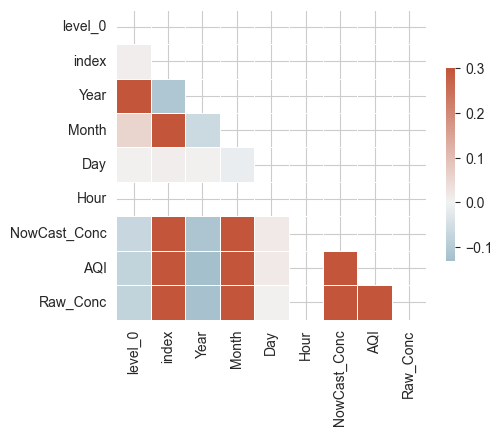

In [80]:
f, ax = plt.subplots(figsize=(5, 5))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

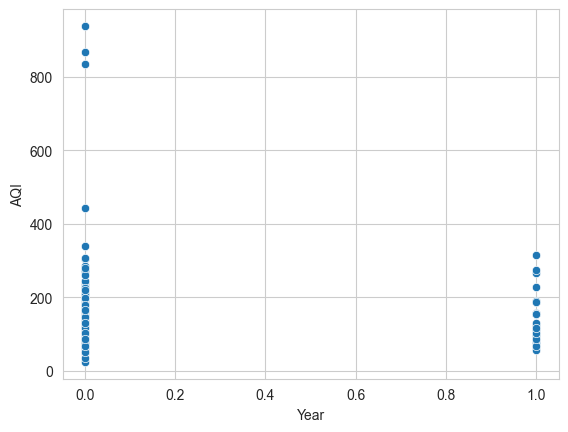

In [81]:
sns.scatterplot(x=Final_file_2.Year==2015, y=Final_file_2.AQI, data=Final_file_2);


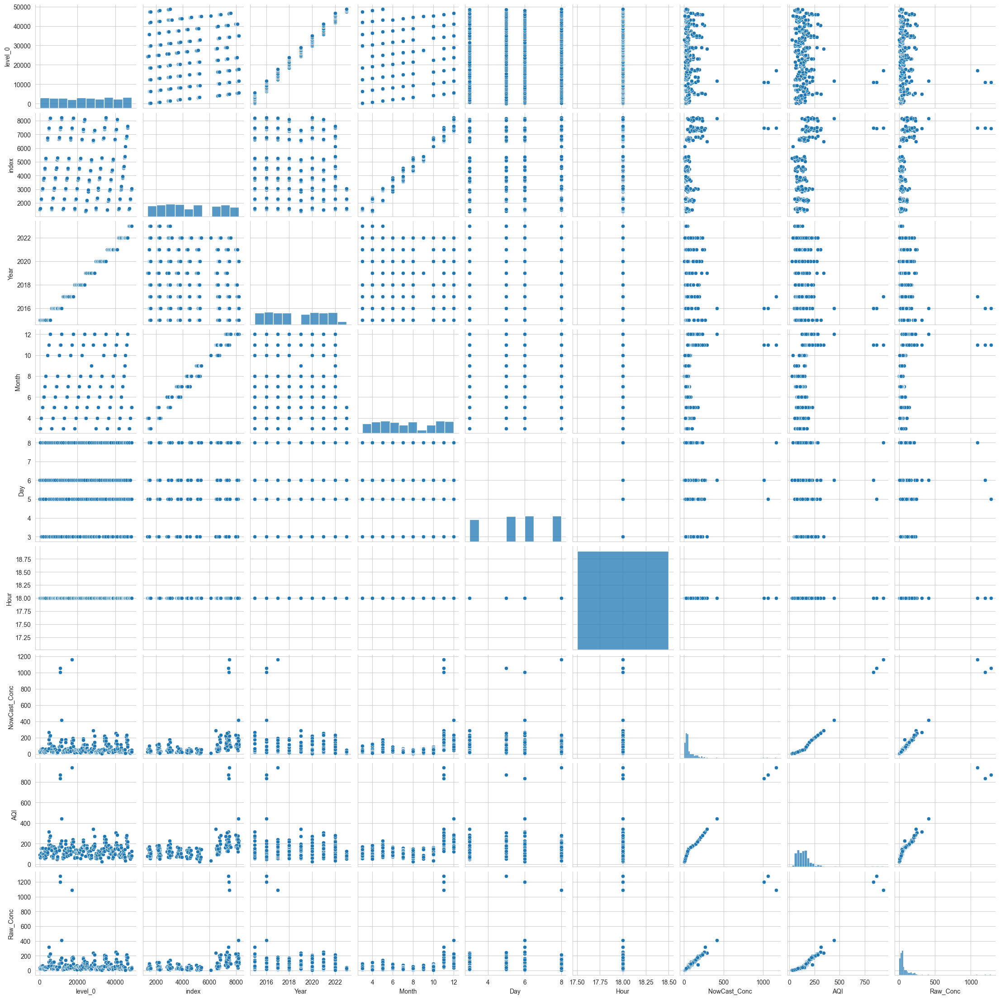

In [82]:
sns.pairplot(Final_file_2, kind="scatter")
plt.show()

In [83]:
from scipy.stats import pearsonr
import matplotlib.pyplot as plt 

def corrfunc(x=Final_file_2.AQI, y=Final_file_2.Year, ax=None, **kws):
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)

/Users/rahulgupta/anaconda3/envs/new/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Users/rahulgupta/anaconda3/envs/new/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Users/rahulgupta/anaconda3/envs/new/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Users/rahulgupta/anaconda3/envs/new/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Users/rahulgupta/anaconda3/envs/new/lib/pyt

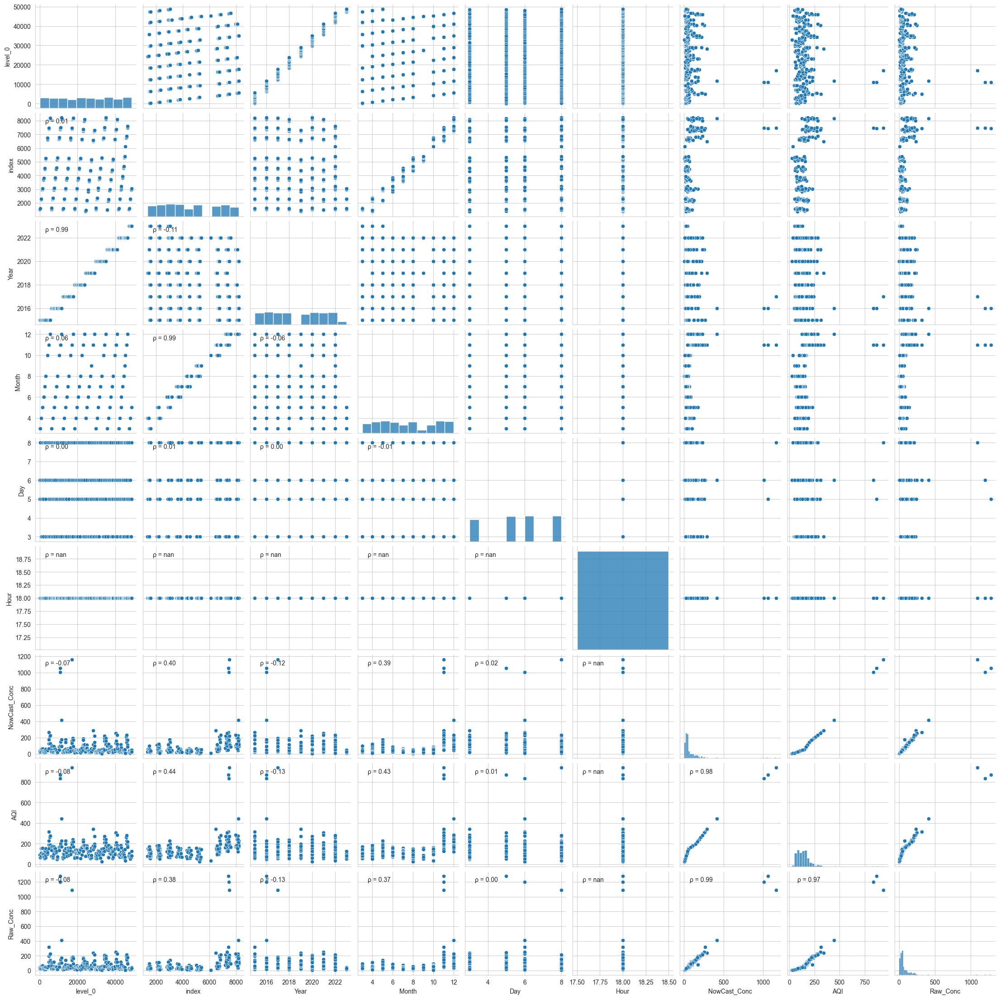

In [88]:
g = sns.pairplot(Final_file_2)
g.map_lower(corrfunc)
plt.show()

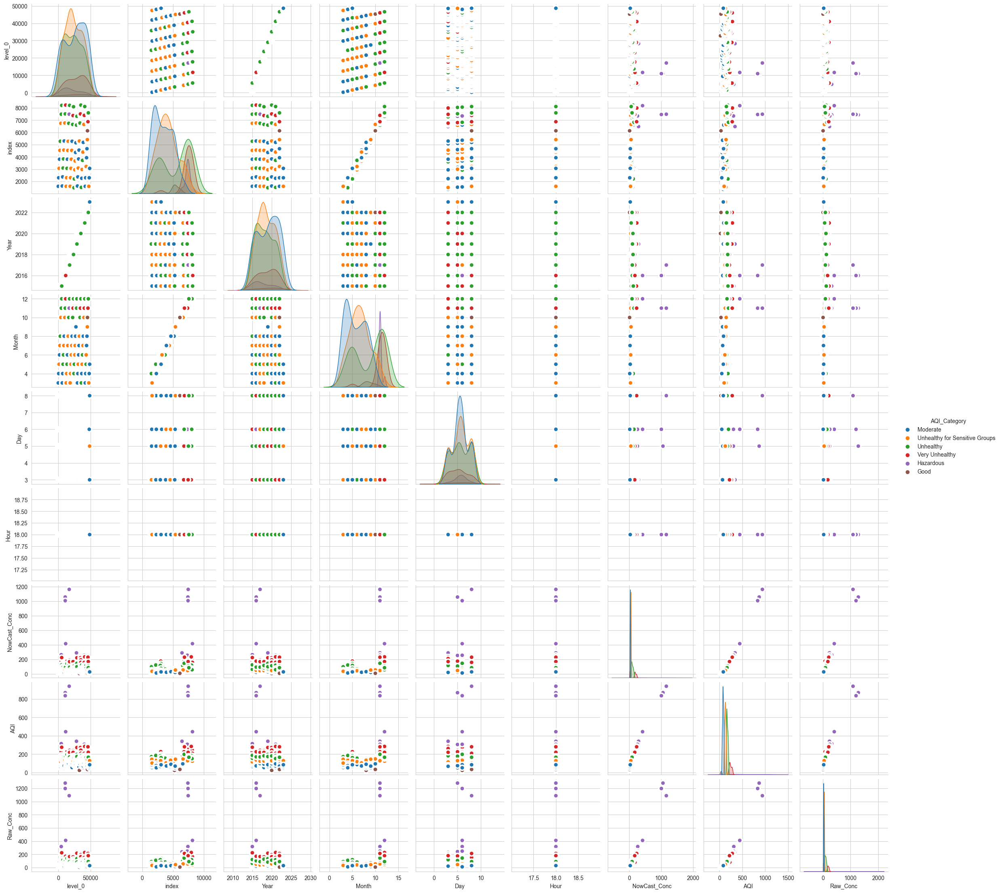

In [87]:
sns.pairplot(Final_file_2, kind="scatter", hue="AQI_Category", plot_kws=dict(s=80, edgecolor="white", linewidth=2.5))
plt.show()


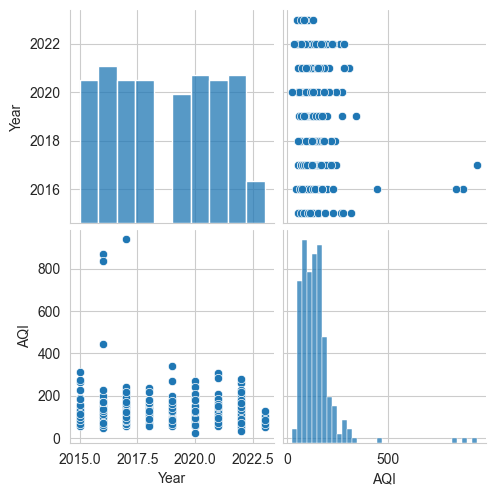

In [95]:
cols_to_plot = ['Year', 'AQI']
sns.pairplot(Final_file_2[cols_to_plot])


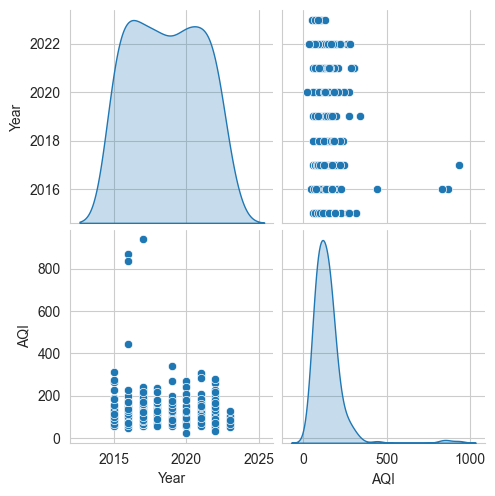

In [92]:
cols_to_plot = ['Year', 'AQI']
sns.pairplot(Final_file_2[cols_to_plot],diag_kind='kde')



In [115]:
filter_final_2=Final_file_2[Final_file_2.Year==2015]

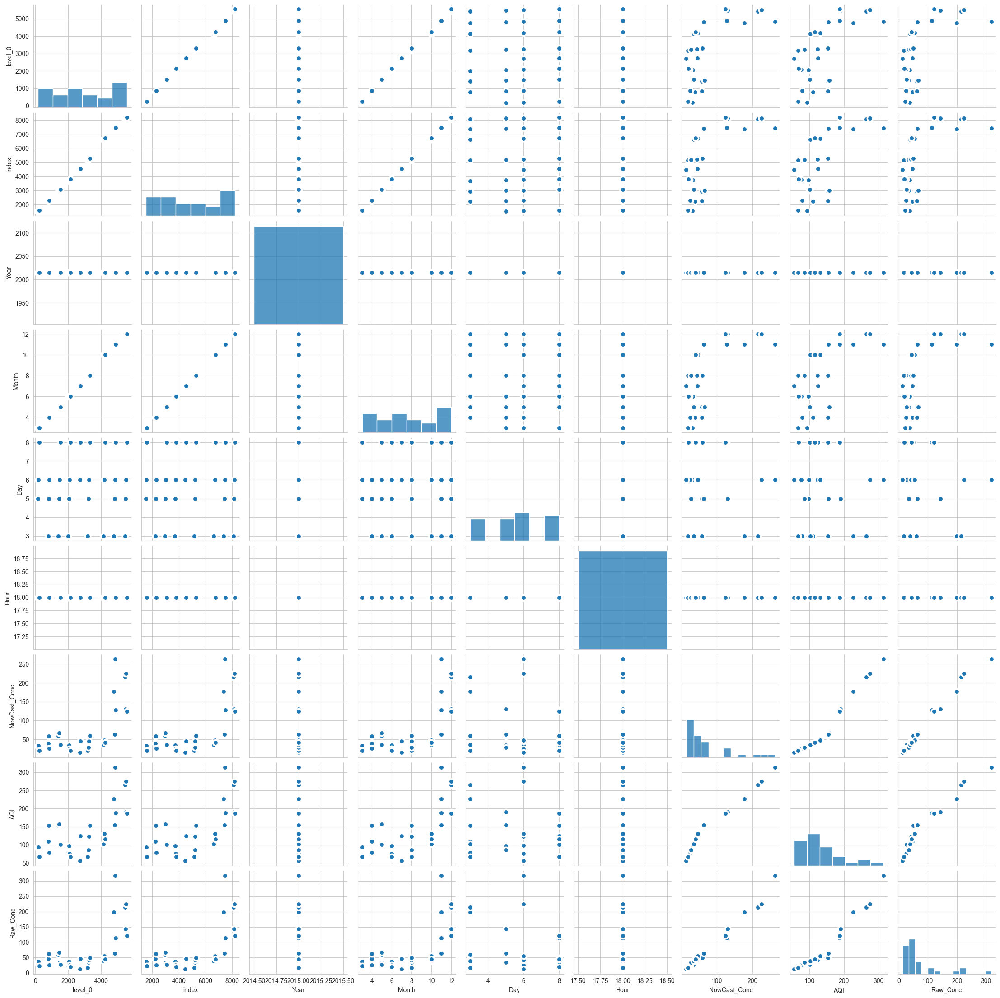

In [117]:
sns.pairplot(filter_final_2, kind="scatter", plot_kws=dict(s=80, edgecolor="white", linewidth=2.5))
plt.show()


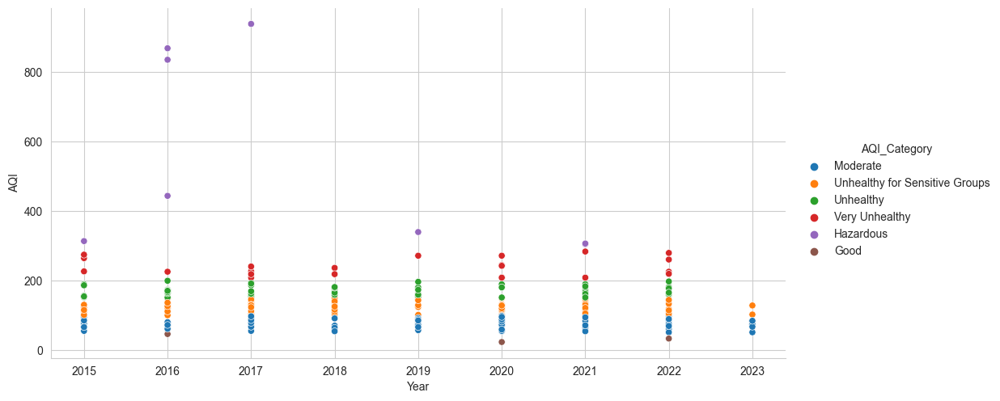

In [147]:
sns.pairplot(Final_file_2,x_vars='Year',y_vars='AQI',hue='AQI_Category',height=5,aspect=2)

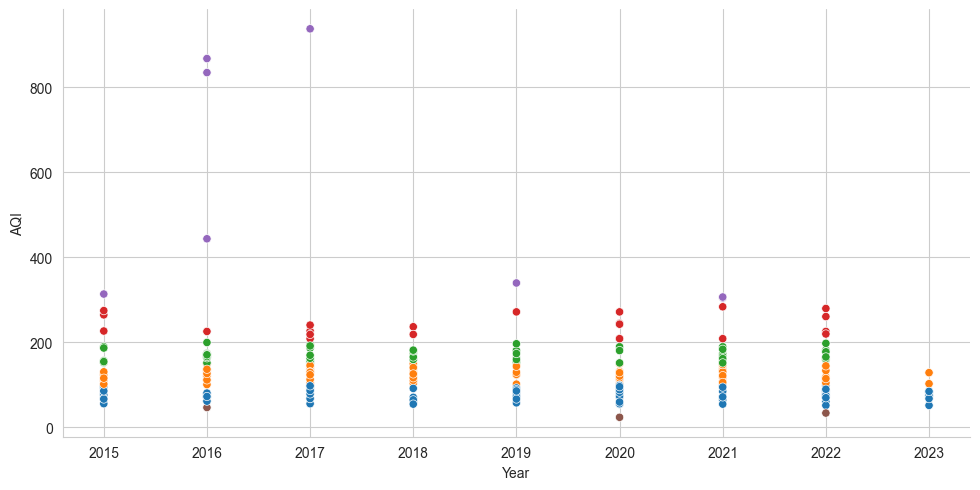

In [148]:
g=sns.PairGrid(Final_file_2,x_vars='Year',y_vars='AQI',hue='AQI_Category',height=5,aspect=2)
g.map(sns.scatterplot)


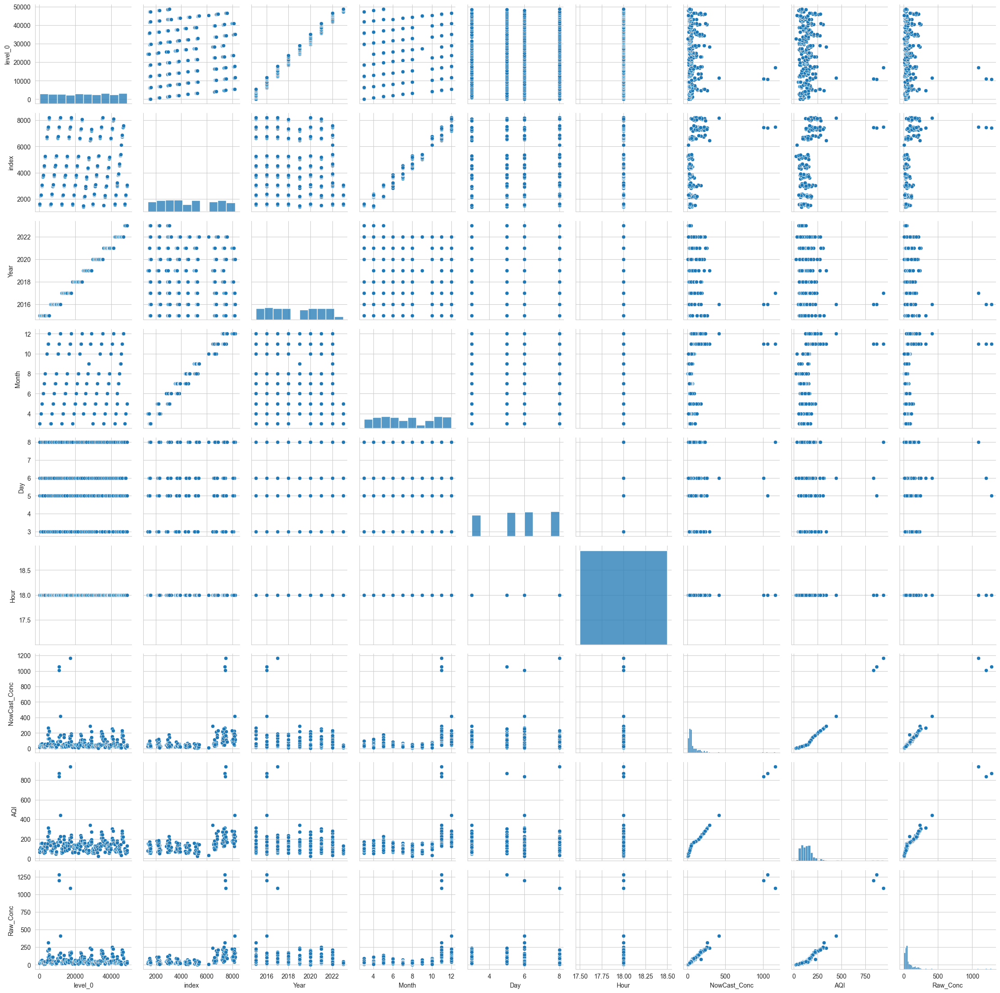

In [149]:
g = sns.PairGrid(Final_file_2)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

/Users/rahulgupta/anaconda3/envs/new/lib/python3.9/site-packages/seaborn/axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
/Users/rahulgupta/anaconda3/envs/new/lib/python3.9/site-packages/seaborn/axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
/Users/rahulgupta/anaconda3/envs/new/lib/python3.9/site-packages/seaborn/axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
/Users/rahulgupta/anaconda3/envs/new/lib/python3.9/site-packages/seaborn/axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
/Users/rahulgupta/anaconda3/

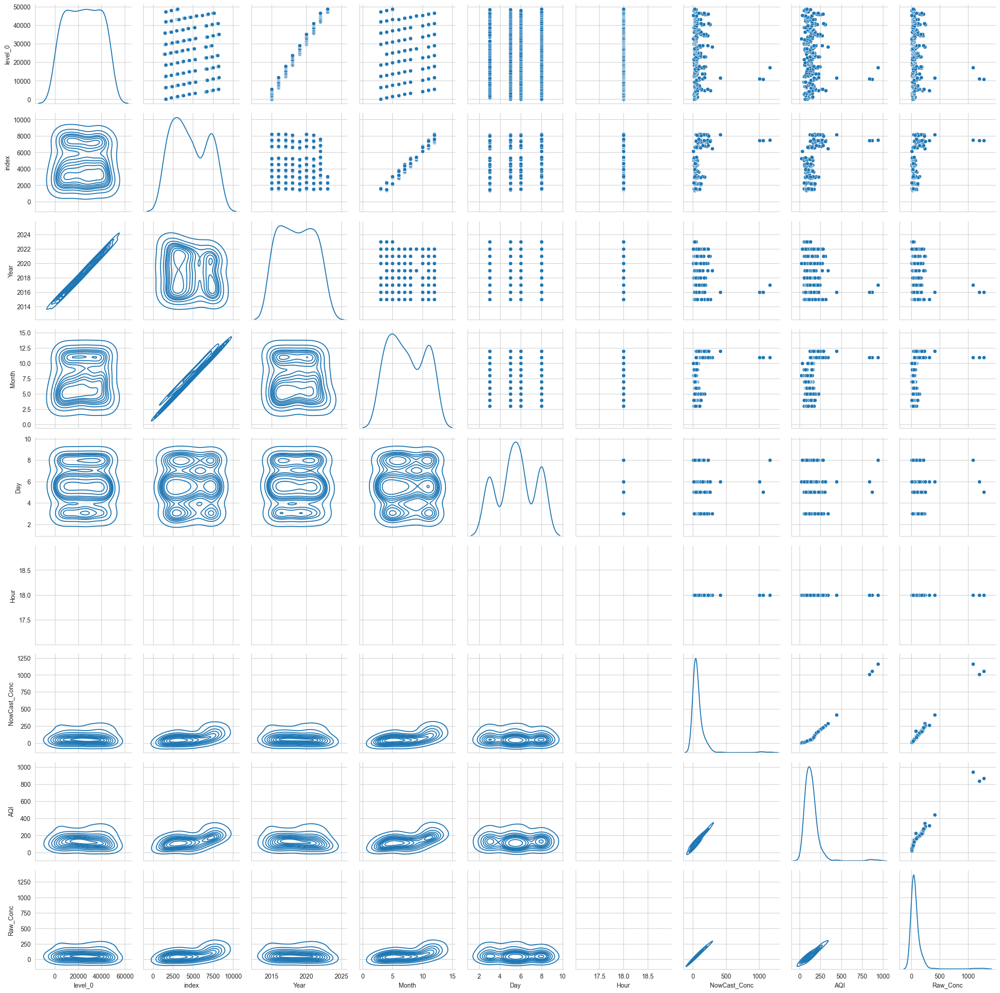

In [150]:
g = sns.PairGrid(Final_file_2, diag_sharey=False)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot)

/Users/rahulgupta/anaconda3/envs/new/lib/python3.9/site-packages/seaborn/axisgrid.py:1507: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=vector, **plot_kwargs)


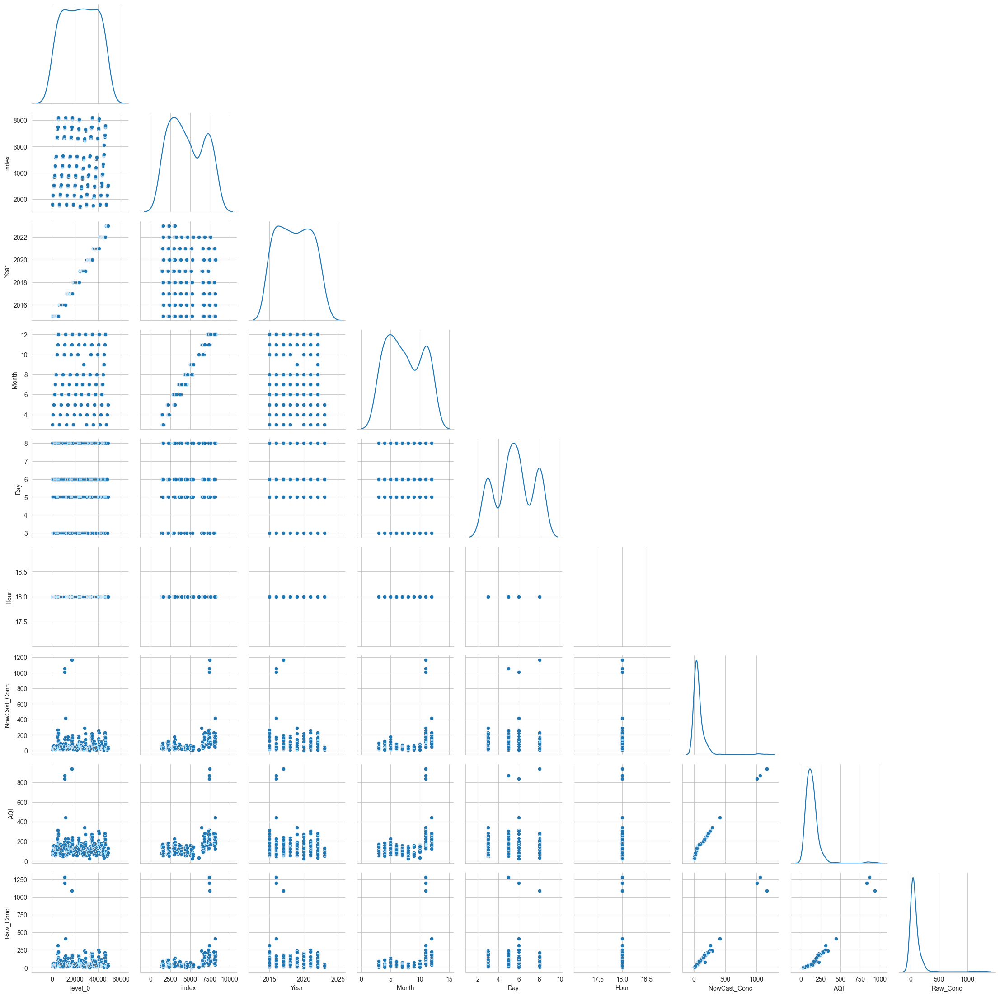

In [151]:
g = sns.PairGrid(Final_file_2, diag_sharey=False, corner=True)
g.map_lower(sns.scatterplot)
g.map_diag(sns.kdeplot)

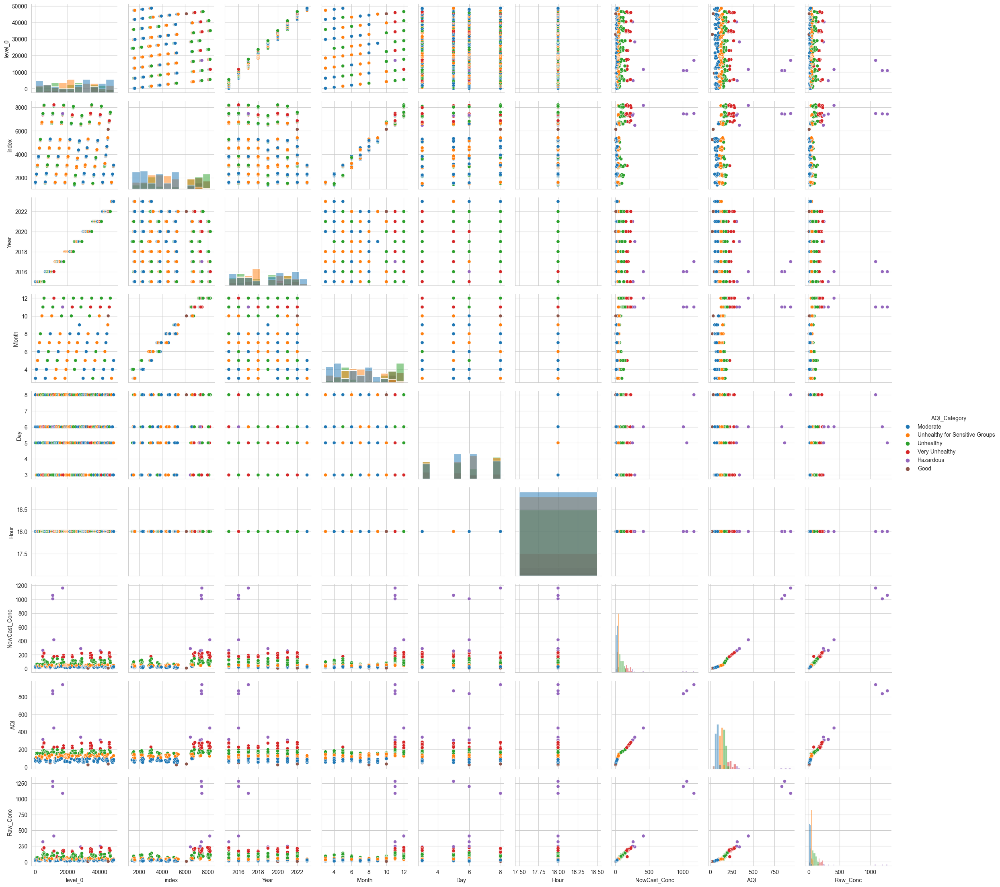

In [153]:
g = sns.PairGrid(Final_file_2, hue="AQI_Category")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

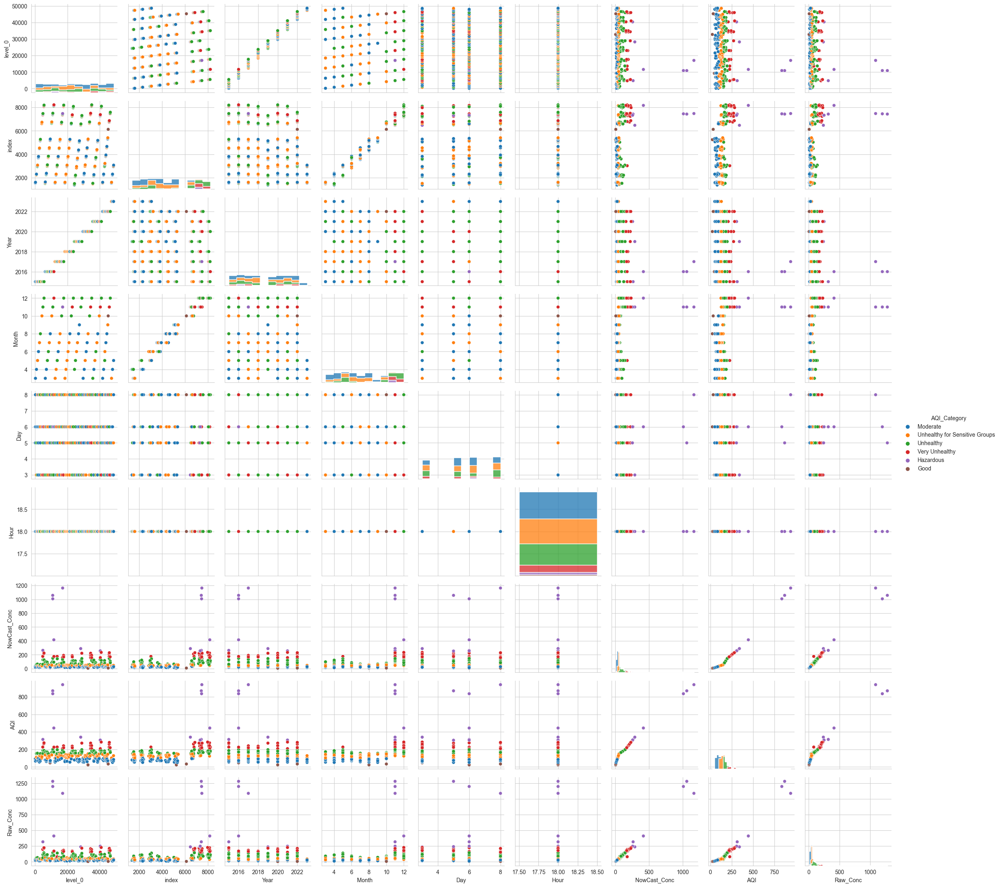

In [154]:
g = sns.PairGrid(Final_file_2, hue="AQI_Category")
g.map_diag(sns.histplot, multiple="stack", element="step")
g.map_offdiag(sns.scatterplot)
g.add_legend()